In [1]:
import talib
import numpy as np
from scipy.stats import pearsonr
import statsmodels.api as sm

import pandas as pd
import statsmodels
from statsmodels.tsa.stattools import coint, adfuller

import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="whitegrid")

In [2]:
from futu import *

############################ 全局变量设置 ############################
FUTUOPEND_ADDRESS = '127.0.0.1'  # FutuOpenD 监听地址
FUTUOPEND_PORT = 11111  # FutuOpenD 监听端口

TRADING_ENVIRONMENT = TrdEnv.SIMULATE  # 交易环境：真实 / 模拟
TRADING_PWD = '914138'  # 交易密码，用于解锁交易
TRADING_PERIOD = KLType.K_1M  # 信号 K 线周期
# TRADING_PERIOD = KLType.K_DAY
TRADING_SECURITY = 'HK.00700'  # 交易标的
# FAST_MOVING_AVERAGE = 5  # 均线快线的周期
# SLOW_MOVING_AVERAGE = 10  # 均线慢线的周期
SUBSCRIBE_NUM_THRESHOLD = 20
quote_context = OpenQuoteContext(
    host=FUTUOPEND_ADDRESS, port=FUTUOPEND_PORT)  # 行情对象
trade_context = OpenHKTradeContext(host=FUTUOPEND_ADDRESS, port=FUTUOPEND_PORT,
                                   security_firm=SecurityFirm.FUTUSECURITIES)  # 交易对象，根据交易标的修改交易对象类型

2022-07-21 09:21:55,856 | 18836 | [open_context_base.py] _send_init_connect_sync:311: InitConnect ok: conn_id=1, host=127.0.0.1, port=11111, user_id=16767859
2022-07-21 09:21:55,863 | 18836 | [open_context_base.py] _send_init_connect_sync:311: InitConnect ok: conn_id=2, host=127.0.0.1, port=11111, user_id=16767859


In [3]:
# some toy tool
def generate_data(params):
    mu = params[0]
    sigma = params[1]
    return np.random.normal(mu, sigma)

d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  after removing the cwd from sys.path.
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if sys.path[0] == '':


Text(0.5, 1.0, 'Non-Stationary')

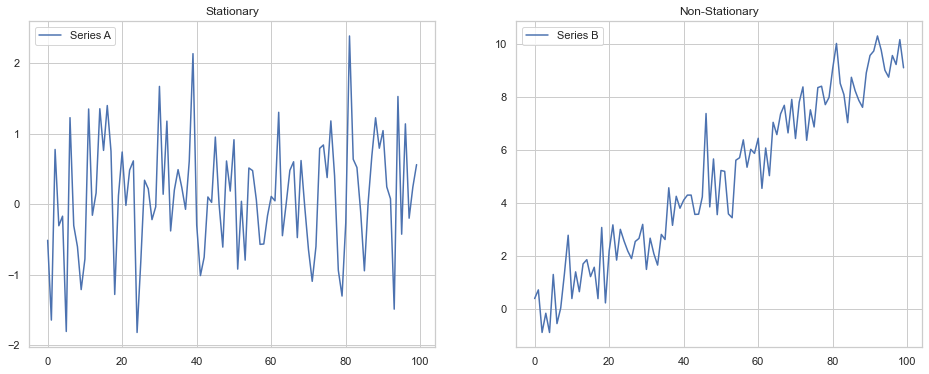

In [4]:
params = (0, 1)
T = 100

A = pd.Series(index=range(T))
A.name = 'A'

for t in range(T):
    A[t] = generate_data(params)

T = 100

B = pd.Series(index=range(T))
B.name = 'B'

for t in range(T):
    # Now the parameters are dependent on time
    # Specifically, the mean of the series changes over time
    params = (t * 0.1, 1)
    B[t] = generate_data(params)
    
fig, (ax1, ax2) = plt.subplots(nrows =1, ncols =2, figsize=(16,6))

ax1.plot(A)
ax2.plot(B)
ax1.legend(['Series A'])
ax2.legend(['Series B'])
ax1.set_title('Stationary')
ax2.set_title('Non-Stationary')

In [5]:
test_df = pd.DataFrame({'test': A})
test = test_df['test']
test = sm.add_constant(test)
print(test)
print(test.columns[1])

    const      test
0     1.0 -0.510244
1     1.0 -1.642350
2     1.0  0.777600
3     1.0 -0.304203
4     1.0 -0.168496
..    ...       ...
95    1.0 -0.424148
96    1.0  1.140948
97    1.0 -0.197166
98    1.0  0.243952
99    1.0  0.562814

[100 rows x 2 columns]
test


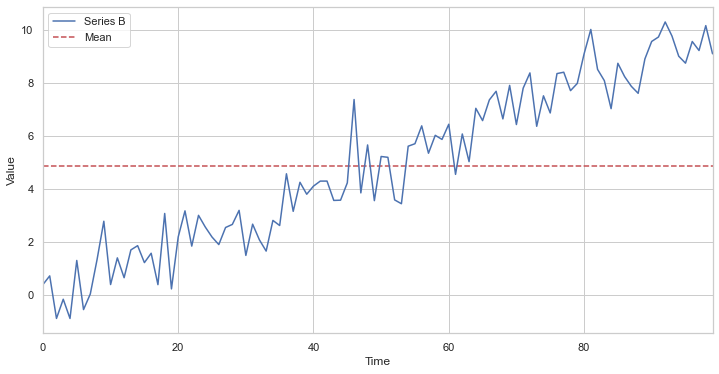

In [6]:
mean = np.mean(B)

plt.figure(figsize=(12,6))
plt.plot(B)
plt.hlines(mean, 0, len(B), linestyles='dashed', colors = 'r')
plt.xlabel('Time')
plt.xlim([0, 99])
plt.ylabel('Value')
plt.legend(['Series B', 'Mean'])

In [7]:
a = np.random.rand(100,)
b = np.random.rand(100,)

In [8]:
def stationarity_test(X, cutoff=0.01):
    # H_0 in adfuller is unit root exists (non-stationary)
    # We must observe significant p-value to convince ourselves that the series is stationary
    pvalue = adfuller(X)[1]
#     print(pvalue)
    if pvalue < cutoff:
        print('p-value = ' + str(pvalue) + ' The series ' + X.name +' is likely stationary.')
    else:
        print('p-value = ' + str(pvalue) + ' The series ' + X.name +' is likely non-stationary.')

In [9]:
stationarity_test(A)
stationarity_test(B)

p-value = 3.071337100234889e-10 The series A is likely stationary.
p-value = 0.961749763679326 The series B is likely non-stationary.


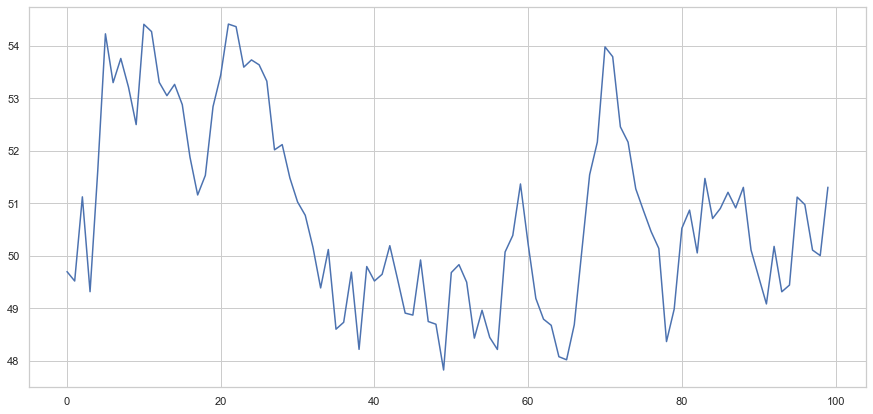

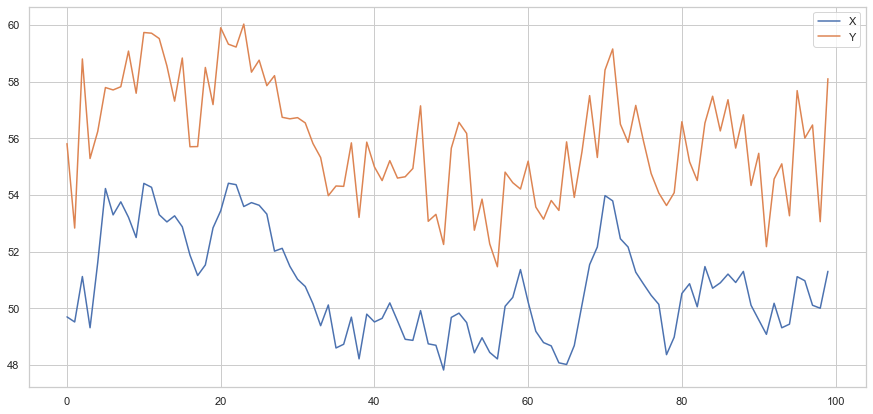

In [10]:
# Generate daily returns

Xreturns = np.random.normal(0, 1, 100)

# sum up and shift the prices up

X = pd.Series(np.cumsum(
    Xreturns), name='X') + 50
X.plot(figsize=(15,7))

noise = np.random.normal(0, 1, 100)
Y = X + 5 + noise
Y.name = 'Y'

pd.concat([X, Y], axis=1).plot(figsize=(15, 7))

plt.show()

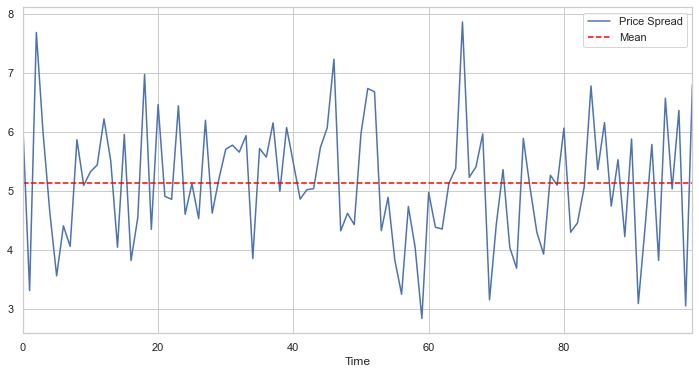

In [11]:
plt.figure(figsize=(12,6))
(Y - X).plot() # Plot the spread
plt.axhline((Y - X).mean(), color='red', linestyle='--') # Add the mean
plt.xlabel('Time')
plt.xlim(0,99)
plt.legend(['Price Spread', 'Mean']);

In [12]:
score, pvalue, _ = coint(X,Y)
print(pvalue)

# Low pvalue means high cointegration!

0.0004209158422383121


(0.0, 99.0)

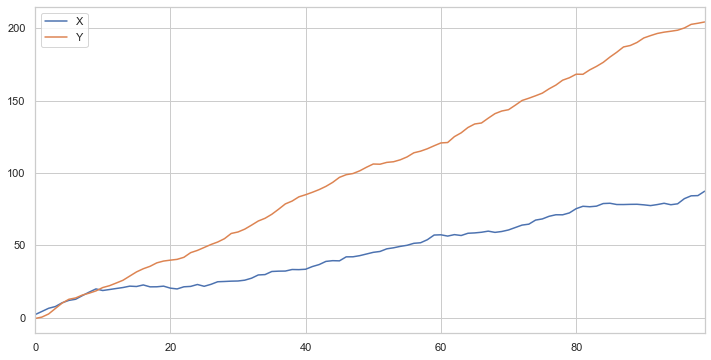

In [13]:
X_returns = np.random.normal(1, 1, 100)
Y_returns = np.random.normal(2, 1, 100)

X_diverging = pd.Series(np.cumsum(X_returns), name='X')
Y_diverging = pd.Series(np.cumsum(Y_returns), name='Y')


pd.concat([X_diverging, Y_diverging], axis=1).plot(figsize=(12,6));
plt.xlim(0, 99)

In [14]:
print('Correlation: ' + str(X_diverging.corr(Y_diverging)))
score, pvalue, _ = coint(X_diverging,Y_diverging)
print('Cointegration test p-value: ' + str(pvalue))

Correlation: 0.9922337826240595
Cointegration test p-value: 0.045541942827010226


In [15]:
def find_cointegrated_pairs(data):
    n = data.shape[1]
    print('n = {}'.format(n))
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    print('keys = {}'.format(keys))
    pairs = []
    for i in range(n):
        for j in range(i+1, n):
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result = coint(S1, S2)
            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue
            if pvalue < 0.05:
                pairs.append((keys[i], keys[j]))
    return score_matrix, pvalue_matrix, pairs

In [16]:
def calculate_spread(s1, s2):
    s1 = sm.add_constant(s1)
    results = sm.OLS(s2, s1).fit()
    # s1.columns[1] is the name of stock
    print('s1: ')
    print(s1)
    print(s1.columns)
    s1_name = s1.columns[1]
    s1 = s1[s1_name]
    w = results.params[s1_name]
    spread = s2 - w * s1
    
    print(spread)
    spread.plot(figsize=(12, 6))
    plt.axhline(spread.mean(), color='black')
    plt.xlim('2020-01-01', '2022-01-07')
    plt.legend(['Spread'])

In [17]:
from futu.quote.open_quote_context import OpenQuoteContext
from futu import *


PLATE_NO_NEW_ENERGY = "HK.BK1033"  # 新能源板块
PLATE_NO_TESLA = "HK.BK1180"  # 特斯拉概念板块
PLATE_NO_TENCENT = "HK.BK1190"  # 腾讯概念板块
PLATE_NO_SOLAR_ENERGY = "HK.BK1233"  # 光伏太阳能板块
PLATE_NO_HOLIDAYS = "HK.BK1998"  # 节假日概念
PLATE_NO_FOOD = "HK.BK1227"  # FOOD CONCEPT
PLATE_NO_BABY = "HK.BK1209"  # BABY CONCEPT
PLATE_NO_MEDICAL_BEAUTY = "HK.BK1086"  # 医疗美容
PLATE_NO_CIGA = "HK.BK1283"  # 烟草
PLATE_NO_RESTAURANT = "HK.BK1083"  # 餐饮

def get_futu_plate_list(quote_context: OpenQuoteContext, market=Market.HK) -> pd.DataFrame:
    """a function wrapper to get plate code via futu api

    Args:
        quote_context (OpenQuoteContext): FUTU quote context
        market ([type], optional): [description]. Defaults to Market.HK.

    Returns:
        pd.DataFrame: [code, plate_name, plate_id]
    """
    ret, data = quote_context.get_plate_list(market, Plate.ALL)
    if ret != RET_OK:
        logger.debug('error: ', data)
    return data

def get_plate_list():
#     plate_list = [PLATE_NO_NEW_ENERGY, PLATE_NO_SOLAR_ENERGY, PLATE_NO_TESLA, 
#                   PLATE_NO_TENCENT, PLATE_NO_FOOD, PLATE_NO_HOLIDAYS, PLATE_NO_BABY,
#                   PLATE_NO_MEDICAL_BEAUTY, PLATE_NO_CIGA, PLATE_NO_RESTAURANT] 
    plate_list = [PLATE_NO_TESLA]
    print("plate list = {}".format(plate_list))
    return plate_list

def get_stock_list_by_plate(quote_context: OpenQuoteContext, plate_code: str) -> pd.DataFrame:
    """get stock by plate code

    Args:
        quote_context (OpenQuoteContext): FUTU quote context
        plate_code (str): plate code, eg. HK.BK1033

    Returns:
        pd.DataFrame: ['code', 'lot_size', 'stock_name', 'stock_type', 'list_time', 'last_trade_time']
    """
    logger.debug("get stock dataframe of plate code: {}".format(plate_code))
    ret, data = quote_context.get_plate_stock(plate_code)
    if ret != RET_OK:
        logger.debug('error: ', data)
        return None
    return data[['code', 'lot_size', 'stock_name', 'stock_type', 'list_time', 'last_trade_time']]


def get_stocks_by_plates(quote_context: OpenQuoteContext, plate_code_list: list) -> dict:
    """get stocks by plate code list

    Args:
        quote_context (OpenQuoteContext): FUTU quote context
        plate_code_list (list): list of plate code

    Returns:
        dict: {plate_code <str>: stock_df <pd.Dataframe ['code', 'stock_name', 'list_time']>}
    """
    plate_stocks = {}
    for plate_code in plate_code_list:
        stock_df = get_stock_list_by_plate(quote_context=quote_context, plate_code=plate_code)
        plate_stocks[plate_code] = stock_df[['code', 'stock_name', 'list_time']] 
    return plate_stocks

def get_stocks(quote_context: OpenQuoteContext) -> pd.DataFrame:
    """generate stock list for further analysis

    Args:
        quote_context (OpenQuoteContext): FUTU quote context

    Returns:
        pd.DataFrame: ['code', 'stock_name', 'list_time']
    """
    plate_code_list = get_plate_list() 
    plate_stocks = get_stocks_by_plates(quote_context, plate_code_list)
    stock_dataframes = [stock_dataframe for plate, stock_dataframe in plate_stocks.items()] 
    stock_df = pd.concat(stock_dataframes)
    # remove duplicates
    stock_df.drop_duplicates('code', keep='first', inplace=True)
    return stock_df

In [18]:
def is_filtered(data):
    fifty_days_ma = talib.EMA(data['close'], timeperiod=50)
    return fifty_days_ma.iloc[-1] <= 2


def query_code_data(start_time, end_time):
    stock_df = get_stocks(quote_context)
    code_list = stock_df['code'].tolist()
    code_name_list = stock_df['stock_name'].tolist()
    print("raw code list = {}, raw code names = {}".format(code_list, code_name_list))
    code_data = dict()
    for code in code_list:
        try:
            code_name = code_name_list[code_list.index(code)]
            print('query data of code: {}, code_name: {}'.format(code, code_name))
            ret, data, page_req_key = quote_context.request_history_kline(code, start=start_time, end=end_time, 
                                                                          max_count=1000, ktype=SubType.K_DAY, 
                                                                          autype=AuType.NONE)
            time.sleep(1)
            if ret != RET_OK:
#                 print(data)
                raise Exception('get code = {} list k line failed')
            if data.empty:
                continue
            data = data.set_index('time_key')
            if not is_filtered(data):
                data = data.rename(columns={'close': code_name})
                data = data[code_name]
                code_data[code_name] = data
        except Exception as ex:
            print(ex)
            continue
    code_data = pd.DataFrame(code_data)
    print('data describe: {}'.format(code_data.describe()))
    code_data = code_data.fillna(0)
    return code_data
            

In [19]:
code_data = query_code_data("2021-01-01", "2022-01-01")
code_data2 = query_code_data("2020-04-01", "2022-04-01")

plate list = ['HK.BK1180']
raw code list = ['HK.00425', 'HK.00558', 'HK.00708', 'HK.00729', 'HK.00838', 'HK.01211', 'HK.01316', 'HK.01585', 'HK.01772', 'HK.03606'], raw code names = ['敏实集团', '力劲科技', '恒大汽车', '五龙电动车', '亿和控股', '比亚迪股份', '耐世特', '雅迪控股', '赣锋锂业', '福耀玻璃']
query data of code: HK.00425, code_name: 敏实集团
query data of code: HK.00558, code_name: 力劲科技
query data of code: HK.00708, code_name: 恒大汽车
query data of code: HK.00729, code_name: 五龙电动车
query data of code: HK.00838, code_name: 亿和控股
query data of code: HK.01211, code_name: 比亚迪股份
query data of code: HK.01316, code_name: 耐世特
query data of code: HK.01585, code_name: 雅迪控股
query data of code: HK.01772, code_name: 赣锋锂业
query data of code: HK.03606, code_name: 福耀玻璃
data describe:              敏实集团        力劲科技        恒大汽车       比亚迪股份         耐世特        雅迪控股  \
count  247.000000  247.000000  247.000000  247.000000  247.000000  247.000000   
mean    33.590283   14.464534   27.001538  235.470850    9.991215   15.999312   
std      3.434676

In [20]:
code_data.tail()

,敏实集团,力劲科技,恒大汽车,比亚迪股份,耐世特,雅迪控股,赣锋锂业,福耀玻璃
time_key,,,,,,,,
2021-12-24 00:00:00,33.85,18.06,2.79,262.2,9.34,14.90,116.5,41.45
2021-12-28 00:00:00,33.80,16.94,3.27,259.8,9.67,14.84,120.6,40.60
2021-12-29 00:00:00,33.35,16.58,3.35,262.2,9.37,14.64,121.8,40.40
2021-12-30 00:00:00,33.90,16.06,3.19,263.0,9.37,14.70,120.0,40.00
2021-12-31 00:00:00,34.35,16.02,3.52,266.6,9.68,15.20,122.7,40.30


In [21]:
keys = code_data.keys()
code_data[keys[0]]

time_key
2021-01-04 00:00:00    40.90
2021-01-05 00:00:00    42.05
2021-01-06 00:00:00    41.65
2021-01-07 00:00:00    40.90
2021-01-08 00:00:00    44.40
                       ...  
2021-12-24 00:00:00    33.85
2021-12-28 00:00:00    33.80
2021-12-29 00:00:00    33.35
2021-12-30 00:00:00    33.90
2021-12-31 00:00:00    34.35
Name: 敏实集团, Length: 247, dtype: float64

In [22]:
score_matrix, pvalues, pairs = find_cointegrated_pairs(code_data)
score_matrix2, pvalues2, pairs2 = find_cointegrated_pairs(code_data2)

n = 8
keys = Index(['敏实集团', '力劲科技', '恒大汽车', '比亚迪股份', '耐世特', '雅迪控股', '赣锋锂业', '福耀玻璃'], dtype='object')
n = 8
keys = Index(['敏实集团', '力劲科技', '恒大汽车', '比亚迪股份', '耐世特', '雅迪控股', '赣锋锂业', '福耀玻璃'], dtype='object')


[('敏实集团', '耐世特'), ('力劲科技', '雅迪控股')]


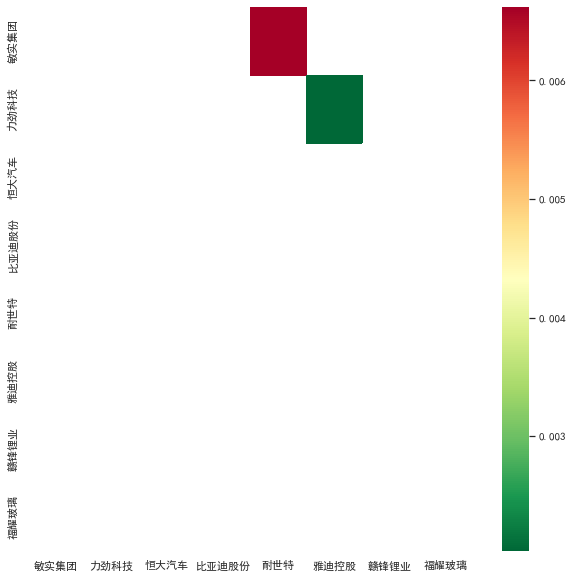

In [23]:
import seaborn
tickers = code_data.keys()
fig, ax = plt.subplots(figsize=(10,10))
rc = {'font.sans-serif': 'SimHei',
      'axes.unicode_minus': False}
seaborn.set(rc=rc)
seaborn.heatmap(pvalues, xticklabels=tickers, yticklabels=tickers, cmap='RdYlGn_r' 
                , mask = (pvalues >= 0.05)
                )
print(pairs)

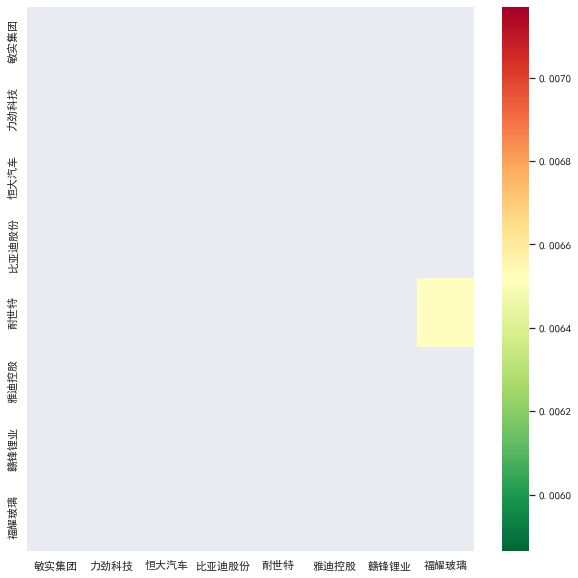

In [24]:
tickers = code_data2.keys()
fig, ax = plt.subplots(figsize=(10,10))
rc = {'font.sans-serif': 'SimHei',
      'axes.unicode_minus': False}
seaborn.set(rc=rc)
seaborn.heatmap(pvalues2, xticklabels=tickers, yticklabels=tickers, cmap='RdYlGn_r' 
                , mask = (pvalues2 >= 0.05))

In [25]:
s1 = code_data['耐世特']
s2 = code_data['福耀玻璃']
score, pvalue, _ = coint(s1, s2)

print(pvalue)

s1_2 = code_data2['耐世特']
s2_2 = code_data2['福耀玻璃']
score2, pvalue2, _ = coint(s1_2, s2_2)
print(pvalue2)

0.05043638854166552
0.006517222242792875


In [26]:
code_data.head()

,敏实集团,力劲科技,恒大汽车,比亚迪股份,耐世特,雅迪控股,赣锋锂业,福耀玻璃
time_key,,,,,,,,
2021-01-04 00:00:00,40.90,1.96,30.65,223.2,8.82,16.02,104.6,45.15
2021-01-05 00:00:00,42.05,1.86,30.45,229.6,8.44,17.50,103.8,45.45
2021-01-06 00:00:00,41.65,1.84,29.00,223.6,7.59,16.70,104.0,44.15
2021-01-07 00:00:00,40.90,2.02,28.30,235.2,7.90,17.00,107.7,43.95
2021-01-08 00:00:00,44.40,2.23,28.50,240.2,8.46,18.94,106.3,45.80


In [27]:
def calculate_spread(s1, s2):
    s1 = sm.add_constant(s1)
    results = sm.OLS(s2, s1).fit()
    # s1.columns[1] is the name of stock
    s1_name = s1.columns[1]
    s1 = s1[s1_name]
    w = results.params[s1_name]
    print("w = {}".format(w))
    spread = s2 - w * s1
    spread.plot(figsize=(12, 6),grid=True)
    print('spread mean = {}'.format(spread.mean()))
    plt.axhline(spread.mean(), color='black')
    plt.legend(['Spread'])
    return w, spread

w = 2.988093381895142
spread mean = 17.783576960962396


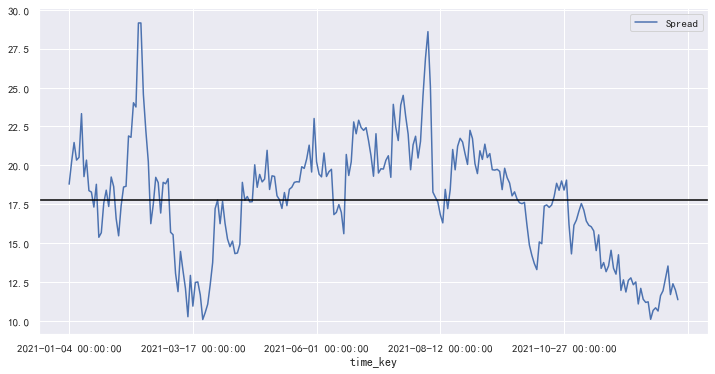

In [28]:
w, spread = calculate_spread(s1, s2)

In [29]:
spread.name = 'Spread'
stationarity_test(spread, cutoff=0.05)

p-value = 0.02180410148210647 The series Spread is likely stationary.


In [30]:
def zscore(series):
    return (series - series.mean()) / np.std(series)

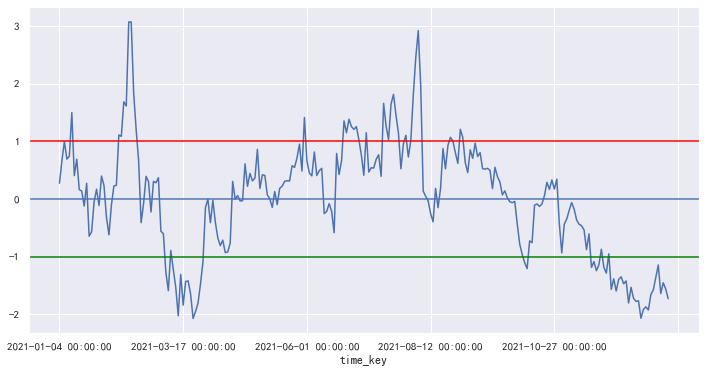

In [31]:
zscore(spread).plot(figsize=(12,6))
plt.axhline(zscore(spread).mean())
plt.axhline(1.0, color='red')
plt.axhline(-1.0, color='green')
plt.show()

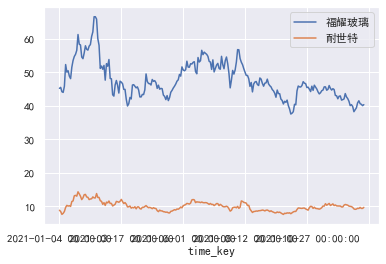

In [32]:
code_data[['福耀玻璃', '耐世特']].plot()

In [33]:
#     fromdate = datetime.datetime.strptime(args.fromdate, '%Y-%m-%d')
#     todate = datetime.datetime.strptime(args.todate, '%Y-%m-%d')
from datetime import datetime, timedelta

def query_trade_calander(fromdate, enddate):
    ret, data = quote_context.request_trading_days(market=TradeDateMarket.HK, start=fromdate, end=enddate)
    if ret == RET_OK:
        print('HK market calendar:', data)
    else:
        print('error:', data)
    date_list = [cal_obj['time'] for cal_obj in data]
    return date_list

enddate = datetime.now().strftime("%Y-%m-%d")
trading_dts = query_trade_calander('2021-01-01', enddate)

def find_proper_trading_date(dt, trading_dts):
    dt_str = dt.strftime("%Y-%m-%d")
    if dt_str in trading_dts:
        return dt_str
    for days in range(1, 8):
        d = dt - timedelta(days=days)
        if d.strftime("%Y-%m-%d") in trading_dts:
            return d.strftime("%Y-%m-%d")
        else:
            continue
    return None

HK market calendar: [{'time': '2021-01-04', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-05', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-06', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-07', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-08', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-11', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-12', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-13', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-14', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-15', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-18', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-19', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-20', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-21', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-22', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-25', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-26', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-27', 'trade_date_type': 'WHOLE'}, {'time': '2021-01-28', 'trade_date_type': '

if z-score above 1, mean spread far away above mean, because s2 is too high and s1 is too low, buy s1 sell s2.

if z-score below -1, mean spread far away below mean, because s2 is too low, and s1 is too high, buy s2 sell s1.


In [34]:
# The above could be sent to an independent module
import backtrader as bt
import backtrader.feeds as btfeeds
import backtrader.indicators as btind
import datetime
import pytz
from datetime import datetime, timezone

class PairTradingStrategy(bt.Strategy):
    params = dict(
        period=10,
        stake0=10,
        stake1=10,
        qty1=0,
        qty2=0,
        printout=True,
        upper=2.1,
        lower=-2.1,
        stop_loss=3.1,
        up_medium=0.5,
        low_medium=-0.5,
        status=0,
        init_date=datetime.now(),
        forecast=False,
        init_position0=0,
        init_position1=0,
        init_price0=0,
        init_price1=0
#         portfolio_value=10000,
    )

    def log(self, txt, dt=None):
        if self.p.printout:
            dt = dt or self.data.datetime[0]
            dt = bt.num2date(dt)
            print('%s, %s' % (dt.isoformat(), txt))

    def notify_order(self, order):
        if order.status in [bt.Order.Submitted, bt.Order.Accepted]:
            return  # Await further notifications

        if order.status == order.Completed:
            if order.isbuy():
                buytxt = 'BUY COMPLETE, %.2f' % order.executed.price
                self.log(buytxt, order.executed.dt)
            else:
                selltxt = 'SELL COMPLETE, %.2f' % order.executed.price
                self.log(selltxt, order.executed.dt)

        elif order.status in [order.Expired, order.Canceled, order.Margin]:
            self.log('tradeid: %s status: %s ,' % (order.tradeid, order.Status[order.status]))
            pass  # Simply log

        # Allow new orders
        self.orderid = None

    def __init__(self):
        # To control operation entries
        self.orderid = None
        self.stake0 = self.p.stake0
        self.stake1 = self.p.stake1
        self.qty1 = self.p.qty1
        self.qty2 = self.p.qty2
        self.stop_loss = self.p.stop_loss
        self.upper_limit = self.p.upper
        self.lower_limit = self.p.lower
        self.up_medium = self.p.up_medium
        self.low_medium = self.p.low_medium
        self.status = self.p.status
        self.forecast = self.p.forecast
        self.init_date = self.p.init_date
#         self.portfolio_value = self.p.portfolio_value
        self.portfolio_value = self.broker.get_value()
        # Signals performed with PD.OLS :
        self.transform = btind.OLS_TransformationN(self.data0, self.data1,
                                                   period=self.p.period)
        self.zscore = self.transform.zscore
  
        
        if self.p.init_position0 > 0:
            self.broker.positions[self.data0].set(self.p.init_position0, self.p.init_price0)
        if self.p.init_position1 > 0:
            self.broker.positions[self.data1].set(self.p.init_position1, self.p.init_price1)
        current_pos0 = self.getposition(self.data0, self.broker).size
        current_pos1 = self.getposition(self.data1, self.broker).size
        if current_pos0 > 0 and current_pos1 == 0:
            self.status = 2
        elif current_pos0 == 0 and current_pos1 > 0:
            self.status = 1
        else:
            self.status = 0
        # Checking signals built with StatsModel.API :
        # self.ols_transfo = btind.OLS_Transformation(self.data0, self.data1,
        #                                             period=self.p.period,
        #                                             plot=True)
    def calculate_quantity(self, portfolio_value, close, stake):
        quantity = int(portfolio_value / close)
        quantity = int(quantity / stake) * stake
        return quantity
        
    def next(self):
        dt = self.data.datetime.date()
        portfolio_value = self.broker.get_value()
        possize0 = self.getposition(self.data0, self.broker).size
        possize1 = self.getposition(self.data1, self.broker).size
        cash = self.broker.cash
#         self.log('stop_loss: %.2f' % self.stop_loss)
        self.log('cash: %.2f' % cash)
        self.log('Data0 %s Close: %.2f' % (self.data0._name, self.data0.close[0]))
        self.log('Data1 %s Close: %.2f' % (self.data1._name, self.data1.close[0]))
        self.log('%04d - %s - Data0 Position Size:  %02d  Data1 Position Size: %02d - Value %.2f' %
              (len(self), dt.isoformat(), possize0, possize1, portfolio_value))
        
        if self.orderid:
            return  # if an order is active, no new orders are allowed

        if self.p.printout:
            print('Self  len:', len(self))
            print('Data0 len:', len(self.data0))
            print('Data1 len:', len(self.data1))
            print('Data0 len == Data1 len:',
                  len(self.data0) == len(self.data1))

            print('Data0 dt:', self.data0.datetime.datetime())
            print('Data1 dt:', self.data1.datetime.datetime())

        print('status is', self.status)
        print('zscore is', self.zscore[0])
        proper_dt = find_proper_trading_date(self.init_date, trading_dts)
        print('proper trading datetime: %s' % proper_dt)
        if self.forecast and ((not proper_dt) or (proper_dt != dt.strftime("%Y-%m-%d"))):
            self.log('Forecast mode, proper date: %s, line date: %s, skip' % (proper_dt, dt.strftime("%Y-%m-%d")))
            return
        # checking stop loss
        if (self.zscore[0] > self.stop_loss) or (self.zscore[0] < -self.stop_loss):
            self.log('STOP LOSS WITH ZSCORE: %.2f, STOP LOSS threshold: %.2f' % (self.zscore[0], self.stop_loss))
            # placing order
            order0 = self.order_target_percent(self.data0, 0)
            order1 = self.order_target_percent(self.data1, 0)
#             self.status = 0
            return
        # Step 2: Check conditions for SHORT & place the order
        # Checking the condition for SHORT
        if (self.zscore[0] > self.upper_limit) and (self.status != 1):
            self.log('GO SHORT')
            # placing order
            order0 = self.order_target_percent(self.data0, 0)
            self.log('%s - %s - OrderNo: %s - Order Target Percent: %.2f' % (self.data0._name, dt.isoformat(), order0, 0))
#             order1 = self.order_target_percent(self.data1, 0.9)
#             self.log('%s - %s - OrderNo: %s - Order Target Percent: %.2f' % (self.data1._name, dt.isoformat(), order1, 0.9))
            qty1 = self.calculate_quantity(portfolio_value, self.data1.close[0], stake=self.stake1)
            self.buy(data=self.data1, size=qty1)
            self.log('BUY CREATE %s, price = %.2f, qty = %d' % (self.data1._name, self.data1.close[0], qty1))
            self.status = 1  # The current status is "short the spread"

            # Step 3: Check conditions for LONG & place the order
            # Checking the condition for LONG
        elif (self.zscore[0] < self.lower_limit) and (self.status != 2):
            self.log('GO LONG')
            order1 = self.order_target_percent(self.data1, target=0.0)
            self.log('%s - %s - OrderNo: %s - Order Target Percent: %.2f' % (self.data1._name, dt.isoformat(), order1, 0))
#             order0 = self.order_target_percent(self.data0, target=0.9)
#             self.log('%s - %s - OrderNo: %s - Order Target Percent: %.2f' % (self.data0._name, dt.isoformat(), order0, 0.9))
            qty0 = self.calculate_quantity(portfolio_value, self.data0.close[0], stake=self.stake0)
            self.buy(data=self.data0, size=qty0)
            self.log('BUY CREATE %s, price = %.2f, qty = %d' % (self.data0._name, self.data0.close[0], qty0))
            self.status = 2  # The current status is "long the spread"
            # Step 4: Check conditions for No Trade
            # If the z-score is within the two bounds, close all
        """
        elif (self.zscore[0] < self.up_medium and self.zscore[0] > self.low_medium):
            self.log('CLOSE LONG %s, price = %.2f' % ("PEP", self.data0.close[0]))
            self.close(self.data0)
            self.log('CLOSE LONG %s, price = %.2f' % ("KO", self.data1.close[0]))
            self.close(self.data1)
        """

    def stop(self):
        print('==================================================')
        print('Starting Value - %.2f' % self.broker.startingcash)
        print('Ending   Value - %.2f' % self.broker.getvalue())
        print('==================================================')

    def notify_trade(self, trade):
        if not trade.isclosed:
            return
        self.log('OPERATION PROFIT, GROSS %.2f, NET %.2f' %
                 (trade.pnl, trade.pnlcomm))

In [35]:
from backtrader import CommInfoBase

class Futu_CommInfo(CommInfoBase):
    params = (
        ('stocklike', True),
        ('commtype', CommInfoBase.COMM_PERC),
    )

    def _getcommission(self, size, price, pseudoexec):
        return abs(size) * price * self.p.commission + 15

In [36]:
from backtrader.analyzers import PositionsValue

class MyPositionValue():
    def __init__(self, *args, **kwargs):
        super(MyPositionValue, self).__init__(*args, **kwargs)
    
    

In [37]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)


import collections

import backtrader as bt
from backtrader.utils.py3 import items, iteritems

from backtrader.analyzers import TimeReturn, PositionsValue, Transactions, GrossLeverage


class MyPyFolio(bt.Analyzer):
    '''This analyzer uses 4 children analyzers to collect data and transforms it
    in to a data set compatible with ``pyfolio``

    Children Analyzer

      - ``TimeReturn``

        Used to calculate the returns of the global portfolio value

      - ``PositionsValue``

        Used to calculate the value of the positions per data. It sets the
        ``headers`` and ``cash`` parameters to ``True``

      - ``Transactions``

        Used to record each transaction on a data (size, price, value). Sets
        the ``headers`` parameter to ``True``

      - ``GrossLeverage``

        Keeps track of the gross leverage (how much the strategy is invested)

    Params:
      These are passed transparently to the children

      - timeframe (default: ``bt.TimeFrame.Days``)

        If ``None`` then the timeframe of the 1st data of the system will be
        used

      - compression (default: `1``)

        If ``None`` then the compression of the 1st data of the system will be
        used

    Both ``timeframe`` and ``compression`` are set following the default
    behavior of ``pyfolio`` which is working with *daily* data and upsample it
    to obtaine values like yearly returns.

    Methods:

      - get_analysis

        Returns a dictionary with returns as values and the datetime points for
        each return as keys
    '''
    params = (
        ('timeframe', bt.TimeFrame.Days),
        ('compression', 1)
    )

    def __init__(self):
        dtfcomp = dict(timeframe=self.p.timeframe,
                       compression=self.p.compression)

        self._returns = TimeReturn(**dtfcomp)
        self._positions = PositionsValue(headers=True, cash=True)
        self._transactions = Transactions(headers=True)
        self._gross_lev = GrossLeverage()

    def stop(self):
        super(MyPyFolio, self).stop()
        self.rets['returns'] = self._returns.get_analysis()
        self.rets['positions'] = self._positions.get_analysis()
        self.rets['transactions'] = self._transactions.get_analysis()
        self.rets['gross_lev'] = self._gross_lev.get_analysis()

    def get_pf_items(self):
        '''Returns a tuple of 4 elements which can be used for further processing with
          ``pyfolio``

          returns, positions, transactions, gross_leverage

        Because the objects are meant to be used as direct input to ``pyfolio``
        this method makes a local import of ``pandas`` to convert the internal
        *backtrader* results to *pandas DataFrames* which is the expected input
        by, for example, ``pyfolio.create_full_tear_sheet``

        The method will break if ``pandas`` is not installed
        '''
        # keep import local to avoid disturbing installations with no pandas
        import pandas
        from pandas import DataFrame as DF

        #
        # Returns
        cols = ['index', 'return']
        returns = DF.from_records(iteritems(self.rets['returns']),
                                  index=cols[0], columns=cols)
        returns.index = pandas.to_datetime(returns.index)
        returns.index = returns.index.tz_localize('UTC')
        rets = returns['return']
        #
        # Positions
        pss = self.rets['positions']
#         ps = [[k] + v[-2:] for k, v in iteritems(pss)]
        ps = [[k] + v[1:] for k, v in iteritems(pss)]
        cols = ps.pop(0)  # headers are in the first entry
        positions = DF.from_records(ps, index=cols[0], columns=cols)
        positions.index = pandas.to_datetime(positions.index)
        positions.index = positions.index.tz_localize('UTC')

        #
        # Transactions
        txss = self.rets['transactions']
        txs = list()
        # The transactions have a common key (date) and can potentially happend
        # for several assets. The dictionary has a single key and a list of
        # lists. Each sublist contains the fields of a transaction
        # Hence the double loop to undo the list indirection
        for k, v in iteritems(txss):
            for v2 in v:
                txs.append([k] + v2)

        cols = txs.pop(0)  # headers are in the first entry
        transactions = DF.from_records(txs, index=cols[0], columns=cols)
        transactions.index = pandas.to_datetime(transactions.index)
        transactions.index = transactions.index.tz_localize('UTC')

        # Gross Leverage
        cols = ['index', 'gross_lev']
        gross_lev = DF.from_records(iteritems(self.rets['gross_lev']),
                                    index=cols[0], columns=cols)

        gross_lev.index = pandas.to_datetime(gross_lev.index)
        gross_lev.index = gross_lev.index.tz_localize('UTC')
        glev = gross_lev['gross_lev']

        # Return all together
        return rets, positions, transactions, glev


In [38]:
fromdate = "2021-01-01"
enddate = datetime.now().strftime("%Y-%m-%d")

In [39]:
#raw code list = ['HK.01316', 'HK.03606'], raw code names = ['耐世特', '福耀玻璃']
def generateDataFeed(code, start_time, end_time):
    ret, data, page_req_key = quote_context.request_history_kline(code, start=start_time, end=end_time, 
                                                                          max_count=1000, ktype=SubType.K_DAY, 
                                                                          autype=AuType.NONE)
    if ret != RET_OK:
        print(data)
        raise Exception("request history kline failed, code = {}".format(code))
    frame = data[["time_key", "open", "high", "low", "close", "volume"]]
    frame.rename(columns={"time_key": "Date"}, inplace=True)
    frame['Date'] = frame['Date'].apply(lambda time_key: time_key.split()[0])
    frame['Date'] = pd.to_datetime(frame['Date'])
    frame.set_index("Date", inplace=True)
    return frame


def query_trade_calander(fromdate, enddate):
    ret, data = quote_ctx.request_trading_days(market=TradeDateMarket.HK, start=fromdate, end=enddate)
    if ret == RET_OK:
        print('HK market calendar:', data)
    else:
        print('error:', data)
    date_list = [cal_obj['time'] for cal_obj in data]
    return date_list
    

def runstrategy(
    stock1='HK.03606', stock2='HK.01316',
    fromdate=fromdate, enddate=enddate,
    stake0=400,
    stake1=1000,
    lower=-2.1,
    stop_loss=2.5, period=30, forecast=False,
    status=0,
    show_pyfolio=True,
    init_position0=0,
    init_position1=0,
    init_price0=0,
    init_price1=0,
    cash=20000):
    # Create a cerebro
    cerebro = bt.Cerebro(stdstats=False)

    # Get the dates from the args
#     fromdate = datetime.datetime.strptime(args.fromdate, '%Y-%m-%d')
#     todate = datetime.datetime.strptime(args.todate, '%Y-%m-%d')

    # Create data
    data0 = generateDataFeed(stock1, fromdate, enddate)
    data1 = generateDataFeed(stock2, fromdate, enddate)
    # Add the 1st data to cerebro
    data0 = bt.feeds.PandasData(dataname=data0)
    cerebro.adddata(data0, name=stock1)
    # Add the 2nd data to cerebro
    data1 = bt.feeds.PandasData(dataname=data1)
    cerebro.adddata(data1, name=stock2)
    
    # Add the strategy
    cerebro.addstrategy(PairTradingStrategy,
#                         portfolio_value=10000,
                        lower=lower,
                        stop_loss=stop_loss,
                        period=period,
                        stake0=stake0,
                        stake1=stake1,
                        forecast=forecast,
                        status=status,
                        init_position0=init_position0,
                        init_position1=init_position1,
                        init_price0=init_price0,
                        init_price1=init_price1)

    # Add the commission - only stocks like a for each operation
    cerebro.broker.setcash(cash)
    
    # Add the commission - only stocks like a for each operation
    futu_comminfo = Futu_CommInfo(commission=0.0003)
    cerebro.broker.addcommissioninfo(futu_comminfo)
    cerebro.addanalyzer(MyPyFolio, _name='pyfolio')
    # And run it
    results = cerebro.run()
    strat = results[0]
    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
    pyfoliozer = strat.analyzers.getbyname('pyfolio')
    returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
    print("positions:")
    print(positions)
    print("returns:")
    print(returns)
    if not show_pyfolio:
        return cerebro
    import pyfolio as pf
    pf.create_full_tear_sheet(
        returns,
        positions=positions,
        transactions=transactions
#         live_start_date="2021-01-01",
#        round_trips=True
    )
    return cerebro

d:\dev\goldmind_proj\.venv\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

2021-03-01T00:00:00, cash: 20000.00
2021-03-01T00:00:00, Data0 HK.03606 Close: 52.50
2021-03-01T00:00:00, Data1 HK.01316 Close: 11.24
2021-03-01T00:00:00, 0039 - 2021-03-01 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 39
Data0 len: 39
Data1 len: 39
Data0 len == Data1 len: True
Data0 dt: 2021-03-01 00:00:00
Data1 dt: 2021-03-01 00:00:00
status is 0
zscore is -0.3567156705016696
proper trading datetime: 2022-07-21
2021-03-02T00:00:00, cash: 20000.00
2021-03-02T00:00:00, Data0 HK.03606 Close: 51.75
2021-03-02T00:00:00, Data1 HK.01316 Close: 11.02
2021-03-02T00:00:00, 0040 - 2021-03-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 40
Data0 len: 40
Data1 len: 40
Data0 len == Data1 len: True
Data0 dt: 2021-03-02 00:00:00
Data1 dt: 2021-03-02 00:00:00
status is 0
zscore is -0.08990992604564471
proper trading datetime: 2022-07-21
2021-03-03T00:00:00, cash: 20000.00
2021-03-03T00:00:00, Data0 HK.03606 Close: 53.75
2021-03-03T0

Data1 len: 116
Data0 len == Data1 len: True
Data0 dt: 2021-06-23 00:00:00
Data1 dt: 2021-06-23 00:00:00
status is 1
zscore is 3.0568965156859784
proper trading datetime: 2022-07-21
2021-06-23T00:00:00, STOP LOSS WITH ZSCORE: 3.06, STOP LOSS threshold: 2.70
2021-06-24T00:00:00, SELL COMPLETE, 11.40
2021-06-24T00:00:00, OPERATION PROFIT, GROSS 280.00, NET 249.86
2021-06-24T00:00:00, cash: 24829.62
2021-06-24T00:00:00, Data0 HK.03606 Close: 55.20
2021-06-24T00:00:00, Data1 HK.01316 Close: 11.10
2021-06-24T00:00:00, 0117 - 2021-06-24 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 24829.62
Self  len: 117
Data0 len: 117
Data1 len: 117
Data0 len == Data1 len: True
Data0 dt: 2021-06-24 00:00:00
Data1 dt: 2021-06-24 00:00:00
status is 1
zscore is 1.4533939259300792
proper trading datetime: 2022-07-21
2021-06-25T00:00:00, cash: 24829.62
2021-06-25T00:00:00, Data0 HK.03606 Close: 55.95
2021-06-25T00:00:00, Data1 HK.01316 Close: 11.06
2021-06-25T00:00:00, 0118 - 2021-06-25 - Data0 Pos

Self  len: 171
Data0 len: 171
Data1 len: 171
Data0 len == Data1 len: True
Data0 dt: 2021-09-09 00:00:00
Data1 dt: 2021-09-09 00:00:00
status is 1
zscore is 0.0724978828827876
proper trading datetime: 2022-07-21
2021-09-10T00:00:00, cash: 24829.62
2021-09-10T00:00:00, Data0 HK.03606 Close: 45.60
2021-09-10T00:00:00, Data1 HK.01316 Close: 8.66
2021-09-10T00:00:00, 0172 - 2021-09-10 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 24829.62
Self  len: 172
Data0 len: 172
Data1 len: 172
Data0 len == Data1 len: True
Data0 dt: 2021-09-10 00:00:00
Data1 dt: 2021-09-10 00:00:00
status is 1
zscore is -0.3091718431560409
proper trading datetime: 2022-07-21
2021-09-13T00:00:00, cash: 24829.62
2021-09-13T00:00:00, Data0 HK.03606 Close: 44.80
2021-09-13T00:00:00, Data1 HK.01316 Close: 8.40
2021-09-13T00:00:00, 0173 - 2021-09-13 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 24829.62
Self  len: 173
Data0 len: 173
Data1 len: 173
Data0 len == Data1 len: True
Data0 dt: 2021-09-13 

Self  len: 236
Data0 len: 236
Data1 len: 236
Data0 len == Data1 len: True
Data0 dt: 2021-12-15 00:00:00
Data1 dt: 2021-12-15 00:00:00
status is 2
zscore is -2.145564700061536
proper trading datetime: 2022-07-21
2021-12-16T00:00:00, cash: 25099.52
2021-12-16T00:00:00, Data0 HK.03606 Close: 40.30
2021-12-16T00:00:00, Data1 HK.01316 Close: 9.91
2021-12-16T00:00:00, 0237 - 2021-12-16 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 25099.52
Self  len: 237
Data0 len: 237
Data1 len: 237
Data0 len == Data1 len: True
Data0 dt: 2021-12-16 00:00:00
Data1 dt: 2021-12-16 00:00:00
status is 2
zscore is -0.6917169231498083
proper trading datetime: 2022-07-21
2021-12-17T00:00:00, cash: 25099.52
2021-12-17T00:00:00, Data0 HK.03606 Close: 39.75
2021-12-17T00:00:00, Data1 HK.01316 Close: 9.67
2021-12-17T00:00:00, 0238 - 2021-12-17 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 25099.52
Self  len: 238
Data0 len: 238
Data1 len: 238
Data0 len == Data1 len: True
Data0 dt: 2021-12-17 

zscore is 0.32053661881132794
proper trading datetime: 2022-07-21
2022-03-22T00:00:00, cash: 26469.41
2022-03-22T00:00:00, Data0 HK.03606 Close: 30.55
2022-03-22T00:00:00, Data1 HK.01316 Close: 5.05
2022-03-22T00:00:00, 0301 - 2022-03-22 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 26469.41
Self  len: 301
Data0 len: 301
Data1 len: 301
Data0 len == Data1 len: True
Data0 dt: 2022-03-22 00:00:00
Data1 dt: 2022-03-22 00:00:00
status is 1
zscore is 1.4010488880398355
proper trading datetime: 2022-07-21
2022-03-23T00:00:00, cash: 26469.41
2022-03-23T00:00:00, Data0 HK.03606 Close: 30.85
2022-03-23T00:00:00, Data1 HK.01316 Close: 5.15
2022-03-23T00:00:00, 0302 - 2022-03-23 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 26469.41
Self  len: 302
Data0 len: 302
Data1 len: 302
Data0 len == Data1 len: True
Data0 dt: 2022-03-23 00:00:00
Data1 dt: 2022-03-23 00:00:00
status is 1
zscore is 1.2736528754233307
proper trading datetime: 2022-07-21
2022-03-24T00:00:00, cash: 264

Data1 dt: 2022-06-28 00:00:00
status is 2
zscore is -0.09618025892994005
proper trading datetime: 2022-07-21
2022-06-29T00:00:00, cash: 10314.36
2022-06-29T00:00:00, Data0 HK.03606 Close: 40.50
2022-06-29T00:00:00, Data1 HK.01316 Close: 5.64
2022-06-29T00:00:00, 0366 - 2022-06-29 - Data0 Position Size:  400  Data1 Position Size: 00 - Value 26514.36
Self  len: 366
Data0 len: 366
Data1 len: 366
Data0 len == Data1 len: True
Data0 dt: 2022-06-29 00:00:00
Data1 dt: 2022-06-29 00:00:00
status is 2
zscore is -1.3118349222403007
proper trading datetime: 2022-07-21
2022-06-30T00:00:00, cash: 10314.36
2022-06-30T00:00:00, Data0 HK.03606 Close: 39.80
2022-06-30T00:00:00, Data1 HK.01316 Close: 5.64
2022-06-30T00:00:00, 0367 - 2022-06-30 - Data0 Position Size:  400  Data1 Position Size: 00 - Value 26234.36
Self  len: 367
Data0 len: 367
Data1 len: 367
Data0 len == Data1 len: True
Data0 dt: 2022-06-30 00:00:00
Data1 dt: 2022-06-30 00:00:00
status is 2
zscore is -2.008873387707115
proper trading datet

d:\dev\goldmind_proj\.venv\lib\site-packages\pyfolio\pos.py:27: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; multipliers will not be applied'


Start date,2021-01-04
End date,2022-07-21
Total months,18
,Backtest
Annual return,19.477%
Cumulative returns,30.872%
Annual volatility,21.638%
Sharpe ratio,0.93
Calmar ratio,0.94
Stability,0.72
Max drawdown,-20.825%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,20.82,2021-04-19,2021-05-14,2021-06-02,33
1,7.41,2021-06-11,2021-06-16,2021-06-18,6
2,6.63,2021-04-01,2021-04-13,2021-04-16,12
3,5.19,2022-01-10,2022-07-11,NaT,NaN
4,4.30,2021-06-18,2021-06-22,2021-12-23,135


d:\dev\goldmind_proj\.venv\lib\site-packages\pyfolio\tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


Top 10 long positions of all time,max
HK.01316,96.84%


Top 10 short positions of all time,max


Top 10 positions of all time,max
HK.01316,96.84%


d:\dev\goldmind_proj\.venv\lib\site-packages\numpy\lib\nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
d:\dev\goldmind_proj\.venv\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
d:\dev\goldmind_proj\.venv\lib\site-packages\pyfolio\tears.py:755: UserWarning: Unable to generate turnover plot.
  warnings.warn('Unable to generate turnover plot.', UserWarning)


Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.


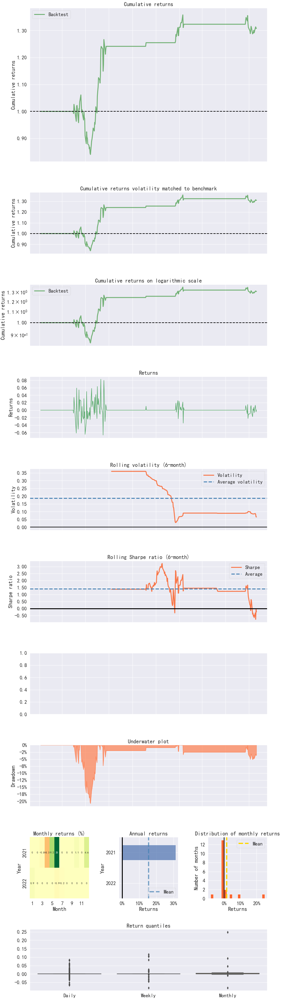

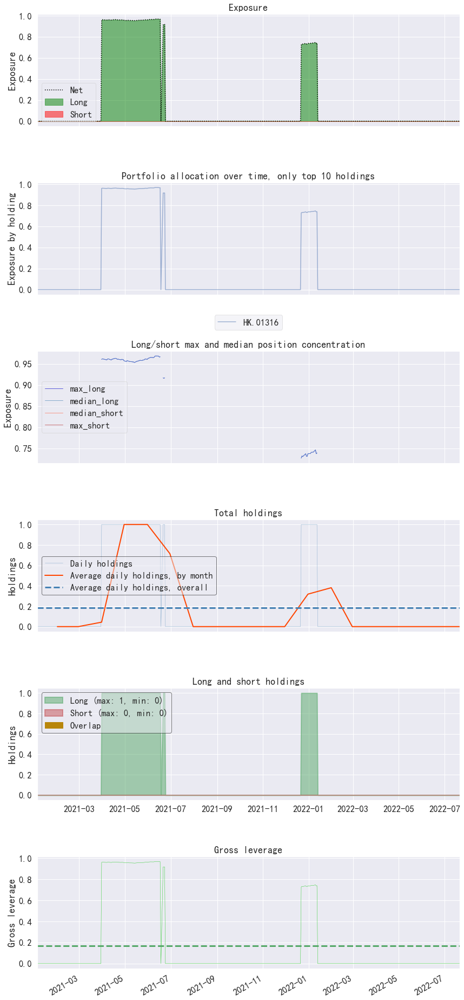

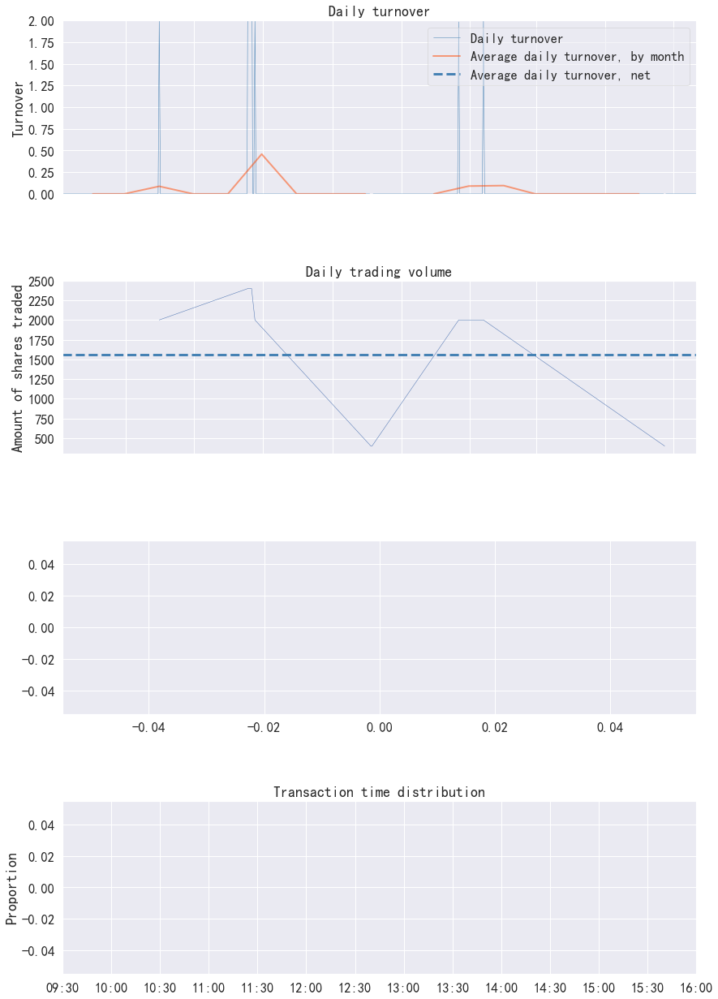

In [40]:
cerebro = runstrategy(stop_loss=2.7)
cerebro
#cerebro = runstrategy(lower=-1.5, stop_loss=2.7)

In [41]:
cerebro

<IPython.core.display.Javascript object>


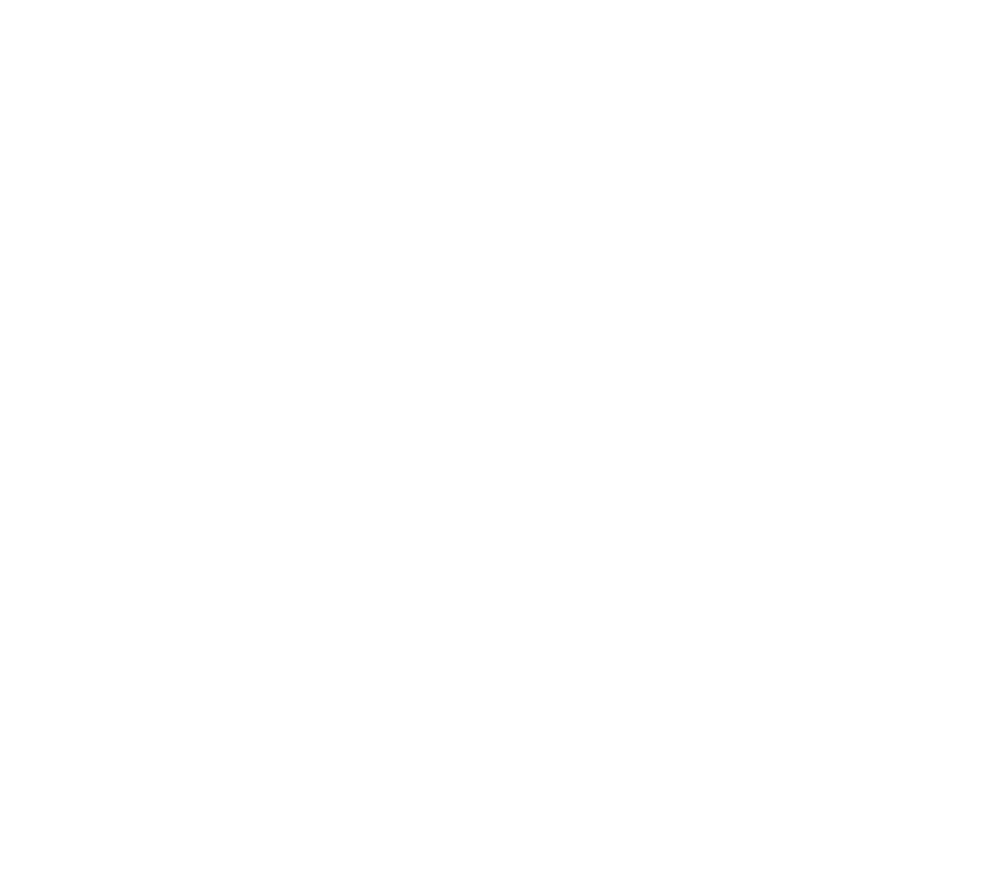

[[<Figure size 3600x3200 with 5 Axes>]]

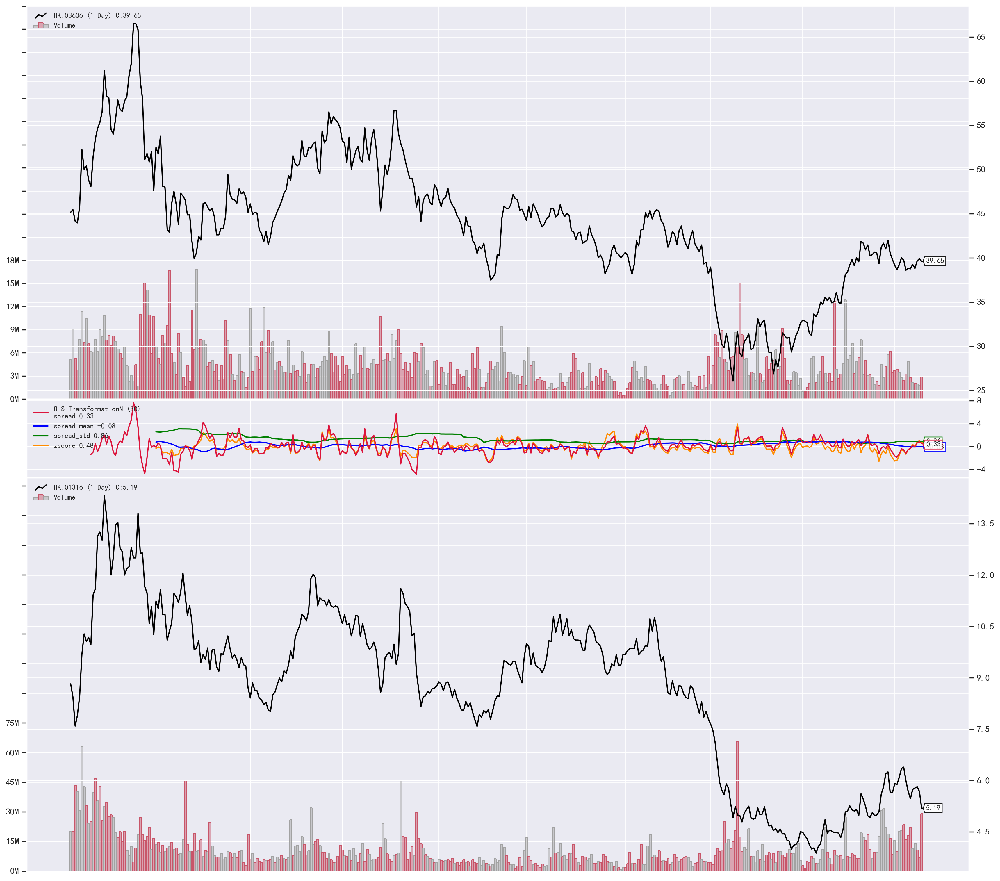

In [42]:
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus']=False
plt.rcParams['figure.figsize']=[18, 16]
plt.rcParams['figure.dpi']=200
plt.rcParams['figure.facecolor']='w'
plt.rcParams['figure.edgecolor']='k'
cerebro.plot(iplot=False)
cerebro.plot()

In [43]:
enddate = datetime.now().strftime("%Y-%m-%d")
cerebro2 = runstrategy(fromdate='2021-01-01', enddate=enddate, forecast=True, show_pyfolio=False, stake0=400, stake1=1000, stop_loss=2.7)

d:\dev\goldmind_proj\.venv\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

2021-03-01T00:00:00, cash: 20000.00
2021-03-01T00:00:00, Data0 HK.03606 Close: 52.50
2021-03-01T00:00:00, Data1 HK.01316 Close: 11.24
2021-03-01T00:00:00, 0039 - 2021-03-01 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 39
Data0 len: 39
Data1 len: 39
Data0 len == Data1 len: True
Data0 dt: 2021-03-01 00:00:00
Data1 dt: 2021-03-01 00:00:00
status is 0
zscore is -0.3567156705016696
proper trading datetime: 2022-07-21
2021-03-01T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-03-01, skip
2021-03-02T00:00:00, cash: 20000.00
2021-03-02T00:00:00, Data0 HK.03606 Close: 51.75
2021-03-02T00:00:00, Data1 HK.01316 Close: 11.02
2021-03-02T00:00:00, 0040 - 2021-03-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 40
Data0 len: 40
Data1 len: 40
Data0 len == Data1 len: True
Data0 dt: 2021-03-02 00:00:00
Data1 dt: 2021-03-02 00:00:00
status is 0
zscore is -0.08990992604564471
proper trading datetime: 2022-07-21
2021-03-

Data0 dt: 2021-06-25 00:00:00
Data1 dt: 2021-06-25 00:00:00
status is 0
zscore is 1.5472908445753148
proper trading datetime: 2022-07-21
2021-06-25T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-06-25, skip
2021-06-28T00:00:00, cash: 20000.00
2021-06-28T00:00:00, Data0 HK.03606 Close: 55.60
2021-06-28T00:00:00, Data1 HK.01316 Close: 11.10
2021-06-28T00:00:00, 0119 - 2021-06-28 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 119
Data0 len: 119
Data1 len: 119
Data0 len == Data1 len: True
Data0 dt: 2021-06-28 00:00:00
Data1 dt: 2021-06-28 00:00:00
status is 0
zscore is 1.003553660088276
proper trading datetime: 2022-07-21
2021-06-28T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-06-28, skip
2021-06-29T00:00:00, cash: 20000.00
2021-06-29T00:00:00, Data0 HK.03606 Close: 55.30
2021-06-29T00:00:00, Data1 HK.01316 Close: 11.06
2021-06-29T00:00:00, 0120 - 2021-06-29 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 

Self  len: 167
Data0 len: 167
Data1 len: 167
Data0 len == Data1 len: True
Data0 dt: 2021-09-03 00:00:00
Data1 dt: 2021-09-03 00:00:00
status is 0
zscore is 0.19194418387825407
proper trading datetime: 2022-07-21
2021-09-03T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-09-03, skip
2021-09-06T00:00:00, cash: 20000.00
2021-09-06T00:00:00, Data0 HK.03606 Close: 46.80
2021-09-06T00:00:00, Data1 HK.01316 Close: 8.84
2021-09-06T00:00:00, 0168 - 2021-09-06 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 168
Data0 len: 168
Data1 len: 168
Data0 len == Data1 len: True
Data0 dt: 2021-09-06 00:00:00
Data1 dt: 2021-09-06 00:00:00
status is 0
zscore is 0.22237806529662976
proper trading datetime: 2022-07-21
2021-09-06T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-09-06, skip
2021-09-07T00:00:00, cash: 20000.00
2021-09-07T00:00:00, Data0 HK.03606 Close: 47.90
2021-09-07T00:00:00, Data1 HK.01316 Close: 8.88
2021-09-07T00:00:00, 016

2021-12-02T00:00:00, 0227 - 2021-12-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 227
Data0 len: 227
Data1 len: 227
Data0 len == Data1 len: True
Data0 dt: 2021-12-02 00:00:00
Data1 dt: 2021-12-02 00:00:00
status is 0
zscore is -0.03725322832146293
proper trading datetime: 2022-07-21
2021-12-02T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-12-02, skip
2021-12-03T00:00:00, cash: 20000.00
2021-12-03T00:00:00, Data0 HK.03606 Close: 42.90
2021-12-03T00:00:00, Data1 HK.01316 Close: 10.08
2021-12-03T00:00:00, 0228 - 2021-12-03 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 228
Data0 len: 228
Data1 len: 228
Data0 len == Data1 len: True
Data0 dt: 2021-12-03 00:00:00
Data1 dt: 2021-12-03 00:00:00
status is 0
zscore is 0.27695144711024594
proper trading datetime: 2022-07-21
2021-12-03T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-12-03, skip
2021-12-06T00:00:00, cash: 20000.00
2021-12-06T

Data0 len: 274
Data1 len: 274
Data0 len == Data1 len: True
Data0 dt: 2022-02-11 00:00:00
Data1 dt: 2022-02-11 00:00:00
status is 0
zscore is -0.3211110169573312
proper trading datetime: 2022-07-21
2022-02-11T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-02-11, skip
2022-02-14T00:00:00, cash: 20000.00
2022-02-14T00:00:00, Data0 HK.03606 Close: 41.55
2022-02-14T00:00:00, Data1 HK.01316 Close: 8.43
2022-02-14T00:00:00, 0275 - 2022-02-14 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 275
Data0 len: 275
Data1 len: 275
Data0 len == Data1 len: True
Data0 dt: 2022-02-14 00:00:00
Data1 dt: 2022-02-14 00:00:00
status is 0
zscore is -0.5579144639282126
proper trading datetime: 2022-07-21
2022-02-14T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-02-14, skip
2022-02-15T00:00:00, cash: 20000.00
2022-02-15T00:00:00, Data0 HK.03606 Close: 41.05
2022-02-15T00:00:00, Data1 HK.01316 Close: 8.39
2022-02-15T00:00:00, 0276 - 2022-02-15 

Data0 len == Data1 len: True
Data0 dt: 2022-05-30 00:00:00
Data1 dt: 2022-05-30 00:00:00
status is 0
zscore is 0.5148305654282102
proper trading datetime: 2022-07-21
2022-05-30T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-05-30, skip
2022-05-31T00:00:00, cash: 20000.00
2022-05-31T00:00:00, Data0 HK.03606 Close: 38.10
2022-05-31T00:00:00, Data1 HK.01316 Close: 5.08
2022-05-31T00:00:00, 0346 - 2022-05-31 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 346
Data0 len: 346
Data1 len: 346
Data0 len == Data1 len: True
Data0 dt: 2022-05-31 00:00:00
Data1 dt: 2022-05-31 00:00:00
status is 0
zscore is -0.2798590944559534
proper trading datetime: 2022-07-21
2022-05-31T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-05-31, skip
2022-06-01T00:00:00, cash: 20000.00
2022-06-01T00:00:00, Data0 HK.03606 Close: 38.40
2022-06-01T00:00:00, Data1 HK.01316 Close: 5.11
2022-06-01T00:00:00, 0347 - 2022-06-01 - Data0 Position Size:  00  Dat

d:\dev\goldmind_proj\.venv\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

2021-03-01T00:00:00, cash: 20000.00
2021-03-01T00:00:00, Data0 HK.00425 Close: 36.80
2021-03-01T00:00:00, Data1 HK.01316 Close: 11.24
2021-03-01T00:00:00, 0039 - 2021-03-01 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 39
Data0 len: 39
Data1 len: 39
Data0 len == Data1 len: True
Data0 dt: 2021-03-01 00:00:00
Data1 dt: 2021-03-01 00:00:00
status is 0
zscore is 0.6525175485472023
proper trading datetime: 2022-07-21
2021-03-02T00:00:00, cash: 20000.00
2021-03-02T00:00:00, Data0 HK.00425 Close: 36.10
2021-03-02T00:00:00, Data1 HK.01316 Close: 11.02
2021-03-02T00:00:00, 0040 - 2021-03-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 40
Data0 len: 40
Data1 len: 40
Data0 len == Data1 len: True
Data0 dt: 2021-03-02 00:00:00
Data1 dt: 2021-03-02 00:00:00
status is 0
zscore is 0.41429672783238963
proper trading datetime: 2022-07-21
2021-03-03T00:00:00, cash: 20000.00
2021-03-03T00:00:00, Data0 HK.00425 Close: 37.35
2021-03-03T00:

zscore is -0.3951882559670502
proper trading datetime: 2022-07-21
2021-06-02T00:00:00, cash: 20000.00
2021-06-02T00:00:00, Data0 HK.00425 Close: 34.00
2021-06-02T00:00:00, Data1 HK.01316 Close: 10.36
2021-06-02T00:00:00, 0102 - 2021-06-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 102
Data0 len: 102
Data1 len: 102
Data0 len == Data1 len: True
Data0 dt: 2021-06-02 00:00:00
Data1 dt: 2021-06-02 00:00:00
status is 2
zscore is -0.31627822195333233
proper trading datetime: 2022-07-21
2021-06-03T00:00:00, cash: 20000.00
2021-06-03T00:00:00, Data0 HK.00425 Close: 33.70
2021-06-03T00:00:00, Data1 HK.01316 Close: 10.52
2021-06-03T00:00:00, 0103 - 2021-06-03 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 103
Data0 len: 103
Data1 len: 103
Data0 len == Data1 len: True
Data0 dt: 2021-06-03 00:00:00
Data1 dt: 2021-06-03 00:00:00
status is 2
zscore is -0.9060994096710909
proper trading datetime: 2022-07-21
2021-06-04T00:00:00, cash

zscore is 0.09583367220244253
proper trading datetime: 2022-07-21
2021-09-08T00:00:00, cash: 8884.97
2021-09-08T00:00:00, Data0 HK.00425 Close: 30.35
2021-09-08T00:00:00, Data1 HK.01316 Close: 8.70
2021-09-08T00:00:00, 0170 - 2021-09-08 - Data0 Position Size:  00  Data1 Position Size: 1000 - Value 17584.97
Self  len: 170
Data0 len: 170
Data1 len: 170
Data0 len == Data1 len: True
Data0 dt: 2021-09-08 00:00:00
Data1 dt: 2021-09-08 00:00:00
status is 1
zscore is -0.8972432940821413
proper trading datetime: 2022-07-21
2021-09-09T00:00:00, cash: 8884.97
2021-09-09T00:00:00, Data0 HK.00425 Close: 29.45
2021-09-09T00:00:00, Data1 HK.01316 Close: 8.43
2021-09-09T00:00:00, 0171 - 2021-09-09 - Data0 Position Size:  00  Data1 Position Size: 1000 - Value 17314.97
Self  len: 171
Data0 len: 171
Data1 len: 171
Data0 len == Data1 len: True
Data0 dt: 2021-09-09 00:00:00
Data1 dt: 2021-09-09 00:00:00
status is 1
zscore is -0.46998859213166827
proper trading datetime: 2022-07-21
2021-09-10T00:00:00, cash

zscore is 1.473484058567619
proper trading datetime: 2022-07-21
2021-11-17T00:00:00, cash: 8884.97
2021-11-17T00:00:00, Data0 HK.00425 Close: 38.15
2021-11-17T00:00:00, Data1 HK.01316 Close: 10.78
2021-11-17T00:00:00, 0216 - 2021-11-17 - Data0 Position Size:  00  Data1 Position Size: 1000 - Value 19664.97
Self  len: 216
Data0 len: 216
Data1 len: 216
Data0 len == Data1 len: True
Data0 dt: 2021-11-17 00:00:00
Data1 dt: 2021-11-17 00:00:00
status is 1
zscore is 2.784753302397755
proper trading datetime: 2022-07-21
2021-11-17T00:00:00, STOP LOSS WITH ZSCORE: 2.78, STOP LOSS threshold: 2.50
2021-11-18T00:00:00, SELL COMPLETE, 10.68
2021-11-18T00:00:00, OPERATION PROFIT, GROSS -420.00, NET -450.07
2021-11-18T00:00:00, cash: 19549.93
2021-11-18T00:00:00, Data0 HK.00425 Close: 36.00
2021-11-18T00:00:00, Data1 HK.01316 Close: 10.32
2021-11-18T00:00:00, 0217 - 2021-11-18 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 19549.93
Self  len: 217
Data0 len: 217
Data1 len: 217
Data0 len ==

status is 1
zscore is -1.0522886145077814
proper trading datetime: 2022-07-21
2022-02-16T00:00:00, cash: 9614.90
2022-02-16T00:00:00, Data0 HK.00425 Close: 33.90
2022-02-16T00:00:00, Data1 HK.01316 Close: 8.76
2022-02-16T00:00:00, 0277 - 2022-02-16 - Data0 Position Size:  00  Data1 Position Size: 1000 - Value 18374.90
Self  len: 277
Data0 len: 277
Data1 len: 277
Data0 len == Data1 len: True
Data0 dt: 2022-02-16 00:00:00
Data1 dt: 2022-02-16 00:00:00
status is 1
zscore is -2.059900480637163
proper trading datetime: 2022-07-21
2022-02-17T00:00:00, cash: 9614.90
2022-02-17T00:00:00, Data0 HK.00425 Close: 33.70
2022-02-17T00:00:00, Data1 HK.01316 Close: 8.71
2022-02-17T00:00:00, 0278 - 2022-02-17 - Data0 Position Size:  00  Data1 Position Size: 1000 - Value 18324.90
Self  len: 278
Data0 len: 278
Data1 len: 278
Data0 len == Data1 len: True
Data0 dt: 2022-02-17 00:00:00
Data1 dt: 2022-02-17 00:00:00
status is 1
zscore is -1.6914369751511331
proper trading datetime: 2022-07-21
2022-02-18T00:0

Data1 dt: 2022-06-15 00:00:00
status is 1
zscore is -1.8173263501260726
proper trading datetime: 2022-07-21
2022-06-16T00:00:00, cash: 1414.85
2022-06-16T00:00:00, Data0 HK.00425 Close: 18.84
2022-06-16T00:00:00, Data1 HK.01316 Close: 4.92
2022-06-16T00:00:00, 0357 - 2022-06-16 - Data0 Position Size:  00  Data1 Position Size: 3000 - Value 16174.85
Self  len: 357
Data0 len: 357
Data1 len: 357
Data0 len == Data1 len: True
Data0 dt: 2022-06-16 00:00:00
Data1 dt: 2022-06-16 00:00:00
status is 1
zscore is -0.766170380660095
proper trading datetime: 2022-07-21
2022-06-17T00:00:00, cash: 1414.85
2022-06-17T00:00:00, Data0 HK.00425 Close: 18.78
2022-06-17T00:00:00, Data1 HK.01316 Close: 5.06
2022-06-17T00:00:00, 0358 - 2022-06-17 - Data0 Position Size:  00  Data1 Position Size: 3000 - Value 16594.85
Self  len: 358
Data0 len: 358
Data1 len: 358
Data0 len == Data1 len: True
Data0 dt: 2022-06-17 00:00:00
Data1 dt: 2022-06-17 00:00:00
status is 1
zscore is -0.9697597363548499
proper trading dateti

Start date,2021-01-04
End date,2022-07-21
Total months,18
,Backtest
Annual return,-10.245%
Cumulative returns,-15.076%
Annual volatility,29.585%
Sharpe ratio,-0.22
Calmar ratio,-0.35
Stability,0.45
Max drawdown,-29.681%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,29.68,2021-08-09,2022-03-21,2022-07-08,240
1,17.49,2022-07-08,2022-07-20,NaT,NaN
2,12.78,2021-06-24,2021-07-27,2021-08-09,33
3,NaN,NaT,NaT,NaT,NaN
4,NaN,NaT,NaT,NaT,NaN


<IPython.core.display.Javascript object>

d:\dev\goldmind_proj\.venv\lib\site-packages\pyfolio\tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


<IPython.core.display.Javascript object>


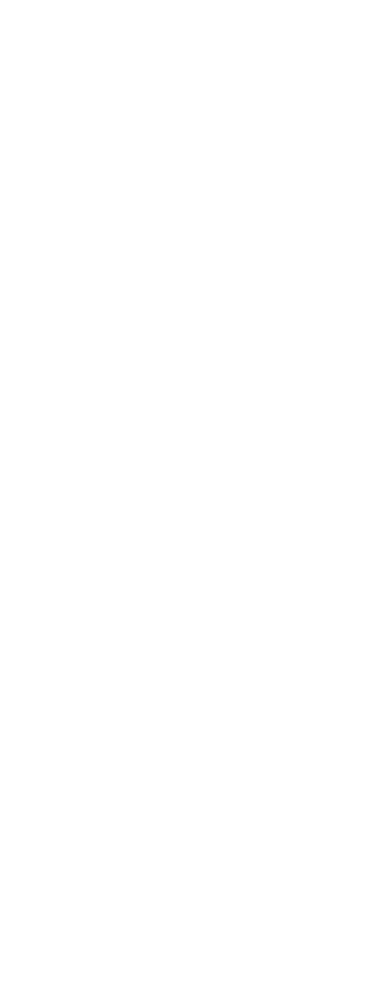

Top 10 long positions of all time,max
HK.01316,93.13%


Top 10 short positions of all time,max


Top 10 positions of all time,max
HK.01316,93.13%


d:\dev\goldmind_proj\.venv\lib\site-packages\numpy\lib\nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<IPython.core.display.Javascript object>


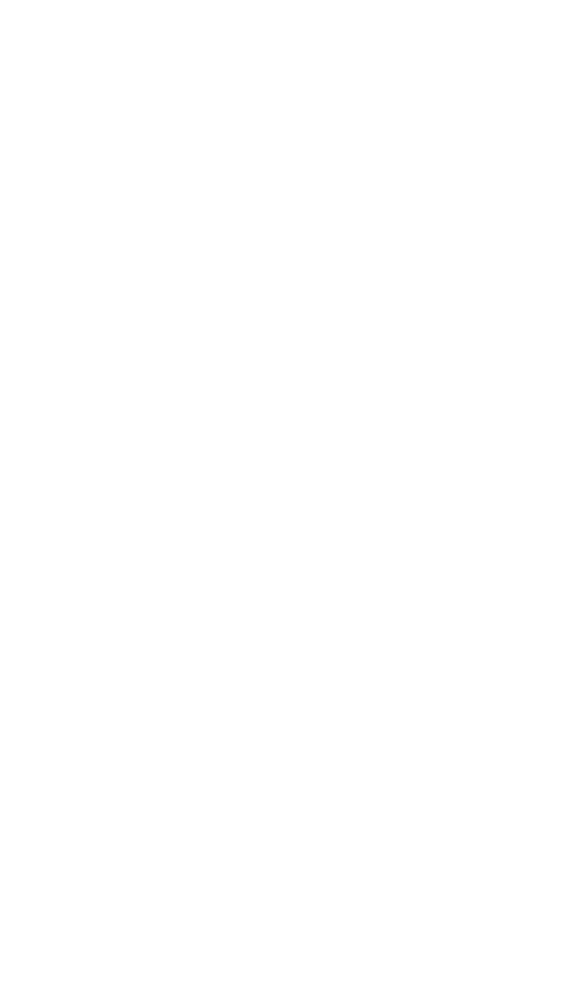

d:\dev\goldmind_proj\.venv\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '-' [U+2212], substituting with a dummy symbol.
Font 'default' does 

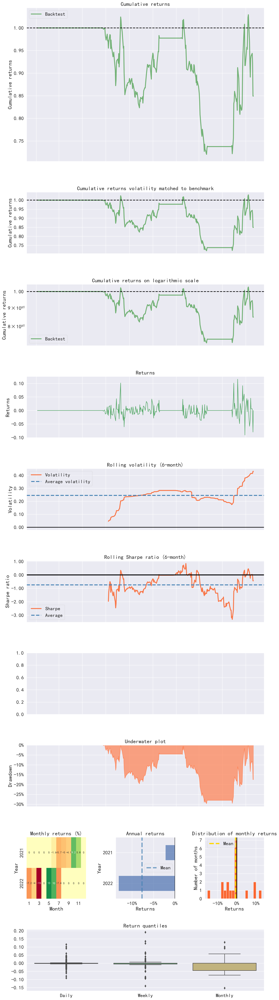

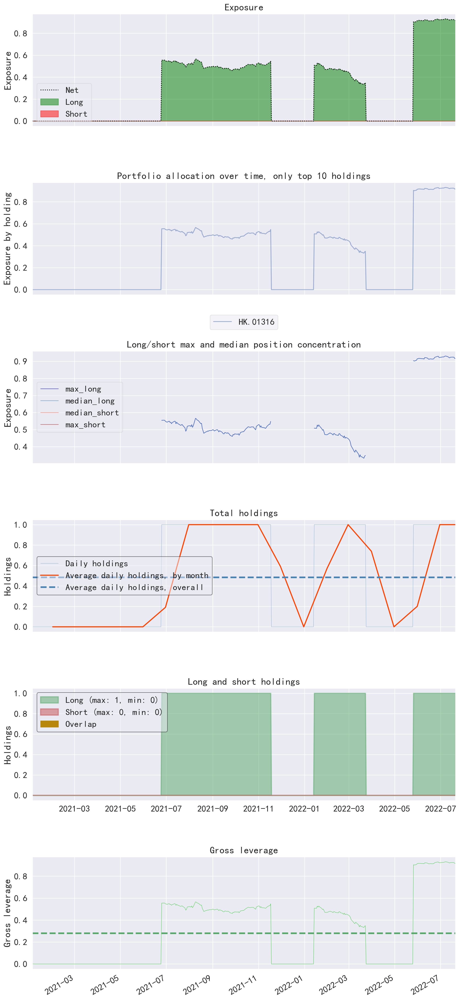

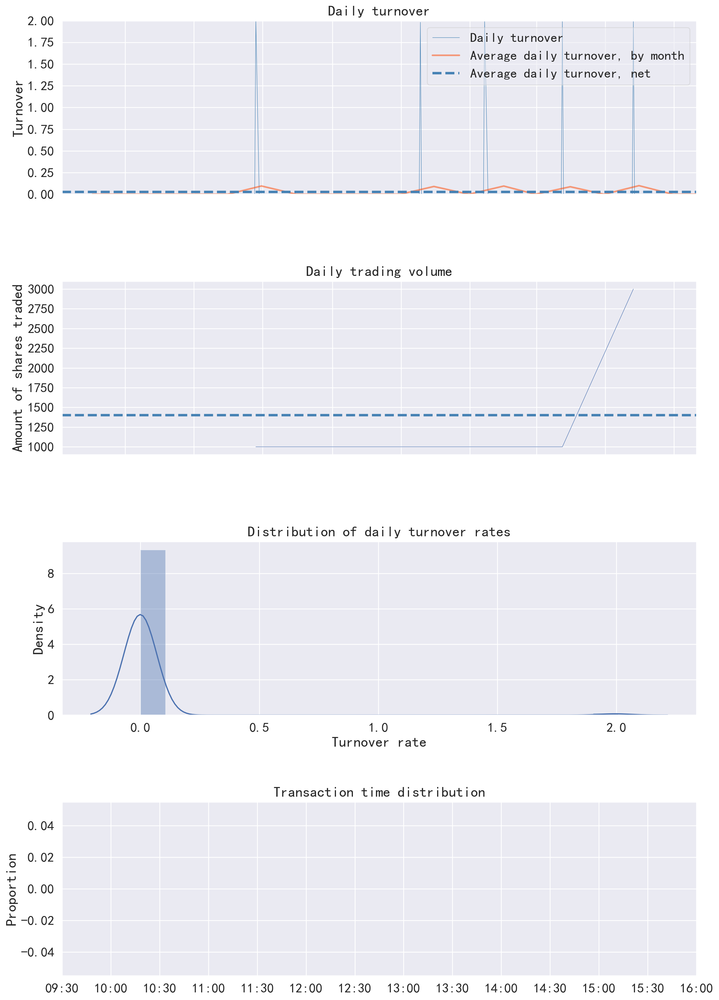

In [44]:
cerebro3 = runstrategy(stock1='HK.00425', stock2='HK.01316', fromdate='2021-01-01', enddate=enddate, stake0=2000, stake1=1000)

In [45]:
cerebro4 = runstrategy(stock1='HK.00425', stock2='HK.01316', 
                       fromdate='2021-01-01', enddate=enddate, forecast=True, show_pyfolio=False, stake0=2000, stake1=1000)

d:\dev\goldmind_proj\.venv\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

2021-03-01T00:00:00, cash: 20000.00
2021-03-01T00:00:00, Data0 HK.00425 Close: 36.80
2021-03-01T00:00:00, Data1 HK.01316 Close: 11.24
2021-03-01T00:00:00, 0039 - 2021-03-01 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 39
Data0 len: 39
Data1 len: 39
Data0 len == Data1 len: True
Data0 dt: 2021-03-01 00:00:00
Data1 dt: 2021-03-01 00:00:00
status is 0
zscore is 0.6525175485472023
proper trading datetime: 2022-07-21
2021-03-01T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-03-01, skip
2021-03-02T00:00:00, cash: 20000.00
2021-03-02T00:00:00, Data0 HK.00425 Close: 36.10
2021-03-02T00:00:00, Data1 HK.01316 Close: 11.02
2021-03-02T00:00:00, 0040 - 2021-03-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 40
Data0 len: 40
Data1 len: 40
Data0 len == Data1 len: True
Data0 dt: 2021-03-02 00:00:00
Data1 dt: 2021-03-02 00:00:00
status is 0
zscore is 0.41429672783238963
proper trading datetime: 2022-07-21
2021-03-02

2021-06-04T00:00:00, cash: 20000.00
2021-06-04T00:00:00, Data0 HK.00425 Close: 34.60
2021-06-04T00:00:00, Data1 HK.01316 Close: 10.86
2021-06-04T00:00:00, 0104 - 2021-06-04 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 104
Data0 len: 104
Data1 len: 104
Data0 len == Data1 len: True
Data0 dt: 2021-06-04 00:00:00
Data1 dt: 2021-06-04 00:00:00
status is 0
zscore is -0.11391982219027307
proper trading datetime: 2022-07-21
2021-06-04T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-06-04, skip
2021-06-07T00:00:00, cash: 20000.00
2021-06-07T00:00:00, Data0 HK.00425 Close: 34.00
2021-06-07T00:00:00, Data1 HK.01316 Close: 10.78
2021-06-07T00:00:00, 0105 - 2021-06-07 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 105
Data0 len: 105
Data1 len: 105
Data0 len == Data1 len: True
Data0 dt: 2021-06-07 00:00:00
Data1 dt: 2021-06-07 00:00:00
status is 0
zscore is -0.5983822965873199
proper trading datetime: 2022-07-21
20

status is 0
zscore is -1.5703602527194818
proper trading datetime: 2022-07-21
2021-09-01T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-09-01, skip
2021-09-02T00:00:00, cash: 20000.00
2021-09-02T00:00:00, Data0 HK.00425 Close: 30.00
2021-09-02T00:00:00, Data1 HK.01316 Close: 8.81
2021-09-02T00:00:00, 0166 - 2021-09-02 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 166
Data0 len: 166
Data1 len: 166
Data0 len == Data1 len: True
Data0 dt: 2021-09-02 00:00:00
Data1 dt: 2021-09-02 00:00:00
status is 0
zscore is -1.81093724117806
proper trading datetime: 2022-07-21
2021-09-02T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-09-02, skip
2021-09-03T00:00:00, cash: 20000.00
2021-09-03T00:00:00, Data0 HK.00425 Close: 29.50
2021-09-03T00:00:00, Data1 HK.01316 Close: 8.62
2021-09-03T00:00:00, 0167 - 2021-09-03 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 167
Data0 len: 167
Data1 len: 167
Data0 l

2021-11-19T00:00:00, 0218 - 2021-11-19 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 218
Data0 len: 218
Data1 len: 218
Data0 len == Data1 len: True
Data0 dt: 2021-11-19 00:00:00
Data1 dt: 2021-11-19 00:00:00
status is 0
zscore is -0.04821176317626747
proper trading datetime: 2022-07-21
2021-11-19T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-11-19, skip
2021-11-22T00:00:00, cash: 20000.00
2021-11-22T00:00:00, Data0 HK.00425 Close: 37.80
2021-11-22T00:00:00, Data1 HK.01316 Close: 10.86
2021-11-22T00:00:00, 0219 - 2021-11-22 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 219
Data0 len: 219
Data1 len: 219
Data0 len == Data1 len: True
Data0 dt: 2021-11-22 00:00:00
Data1 dt: 2021-11-22 00:00:00
status is 0
zscore is -0.17974284693559084
proper trading datetime: 2022-07-21
2021-11-22T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2021-11-22, skip
2021-11-23T00:00:00, cash: 20000.00
2021-11-23

proper trading datetime: 2022-07-21
2022-02-21T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-02-21, skip
2022-02-22T00:00:00, cash: 20000.00
2022-02-22T00:00:00, Data0 HK.00425 Close: 30.90
2022-02-22T00:00:00, Data1 HK.01316 Close: 7.96
2022-02-22T00:00:00, 0281 - 2022-02-22 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 281
Data0 len: 281
Data1 len: 281
Data0 len == Data1 len: True
Data0 dt: 2022-02-22 00:00:00
Data1 dt: 2022-02-22 00:00:00
status is 0
zscore is -0.21395977587265713
proper trading datetime: 2022-07-21
2022-02-22T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-02-22, skip
2022-02-23T00:00:00, cash: 20000.00
2022-02-23T00:00:00, Data0 HK.00425 Close: 31.00
2022-02-23T00:00:00, Data1 HK.01316 Close: 8.30
2022-02-23T00:00:00, 0282 - 2022-02-23 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 282
Data0 len: 282
Data1 len: 282
Data0 len == Data1 len: True
Data0 dt: 2022-02

Data0 dt: 2022-05-25 00:00:00
Data1 dt: 2022-05-25 00:00:00
status is 0
zscore is 2.1435576494137862
proper trading datetime: 2022-07-21
2022-05-25T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-05-25, skip
2022-05-26T00:00:00, cash: 20000.00
2022-05-26T00:00:00, Data0 HK.00425 Close: 19.90
2022-05-26T00:00:00, Data1 HK.01316 Close: 4.46
2022-05-26T00:00:00, 0343 - 2022-05-26 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 20000.00
Self  len: 343
Data0 len: 343
Data1 len: 343
Data0 len == Data1 len: True
Data0 dt: 2022-05-26 00:00:00
Data1 dt: 2022-05-26 00:00:00
status is 0
zscore is 0.5536085166232438
proper trading datetime: 2022-07-21
2022-05-26T00:00:00, Forecast mode, proper date: 2022-07-21, line date: 2022-05-26, skip
2022-05-27T00:00:00, cash: 20000.00
2022-05-27T00:00:00, Data0 HK.00425 Close: 19.34
2022-05-27T00:00:00, Data1 HK.01316 Close: 4.34
2022-05-27T00:00:00, 0344 - 2022-05-27 - Data0 Position Size:  00  Data1 Position Size: 00 - Value 2

d:\dev\goldmind_proj\.venv\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
d:\dev\goldmind_proj\.venv\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

2022-06-21T00:00:00, cash: 5505.00
2022-06-21T00:00:00, Data0 HK.03606 Close: 40.55
2022-06-21T00:00:00, Data1 HK.01316 Close: 4.99
2022-06-21T00:00:00, 0039 - 2022-06-21 - Data0 Position Size:  400  Data1 Position Size: 00 - Value 21725.00
Self  len: 39
Data0 len: 39
Data1 len: 39
Data0 len == Data1 len: True
Data0 dt: 2022-06-21 00:00:00
Data1 dt: 2022-06-21 00:00:00
status is 2
zscore is -0.8902634064202728
proper trading datetime: 2022-07-21
2022-06-22T00:00:00, cash: 5505.00
2022-06-22T00:00:00, Data0 HK.03606 Close: 39.35
2022-06-22T00:00:00, Data1 HK.01316 Close: 5.09
2022-06-22T00:00:00, 0040 - 2022-06-22 - Data0 Position Size:  400  Data1 Position Size: 00 - Value 21245.00
Self  len: 40
Data0 len: 40
Data1 len: 40
Data0 len == Data1 len: True
Data0 dt: 2022-06-22 00:00:00
Data1 dt: 2022-06-22 00:00:00
status is 2
zscore is -2.6016231041471802
proper trading datetime: 2022-07-21
2022-06-23T00:00:00, cash: 5505.00
2022-06-23T00:00:00, Data0 HK.03606 Close: 41.20
2022-06-23T00:00

d:\dev\goldmind_proj\.venv\lib\site-packages\pyfolio\utils.py:266: RuntimeWarning: invalid value encountered in longlong_scalars
  return daily_pos.count(axis=1).sum() / txn_count < threshold


Start date,2022-04-25
End date,2022-07-21
Total months,2
,Backtest
Annual return,29655.785%
Cumulative returns,288.102%
Annual volatility,437.118%
Sharpe ratio,2.26
Calmar ratio,4863.77
Stability,0.69
Max drawdown,-6.097%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,6.10,2022-06-28,2022-07-11,NaT,NaN
1,4.50,2022-06-10,2022-06-22,2022-06-28,13
2,3.75,2022-05-03,2022-05-10,2022-05-11,7
3,2.61,2022-05-25,2022-05-27,2022-05-30,4
4,1.32,2022-05-20,2022-05-23,2022-05-25,4


<IPython.core.display.Javascript object>

d:\dev\goldmind_proj\.venv\lib\site-packages\pyfolio\tears.py:907: UserWarning: Passed returns do not overlap with anyinteresting times.
  'interesting times.', UserWarning)


<IPython.core.display.Javascript object>


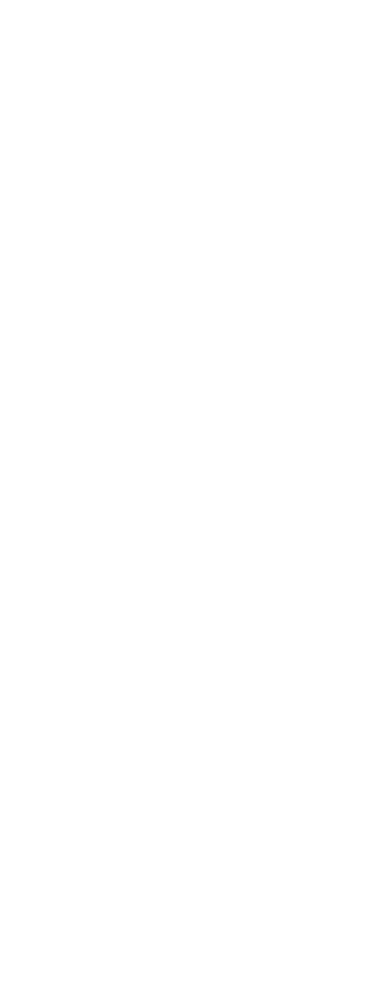

Top 10 long positions of all time,max


Top 10 short positions of all time,max


Top 10 positions of all time,max
HK.01316,0.00%


d:\dev\goldmind_proj\.venv\lib\site-packages\numpy\lib\nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<IPython.core.display.Javascript object>


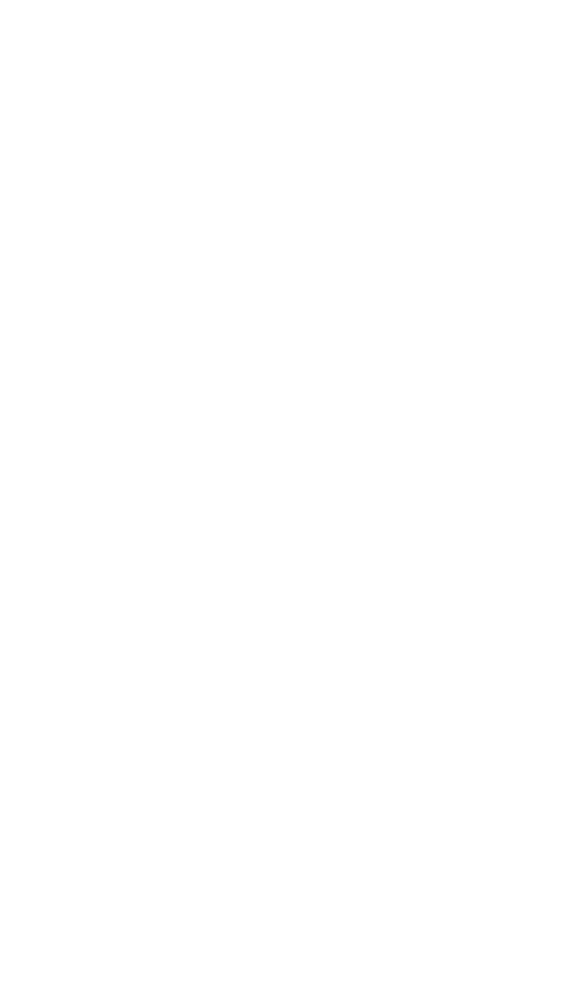

d:\dev\goldmind_proj\.venv\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
d:\dev\goldmind_proj\.venv\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


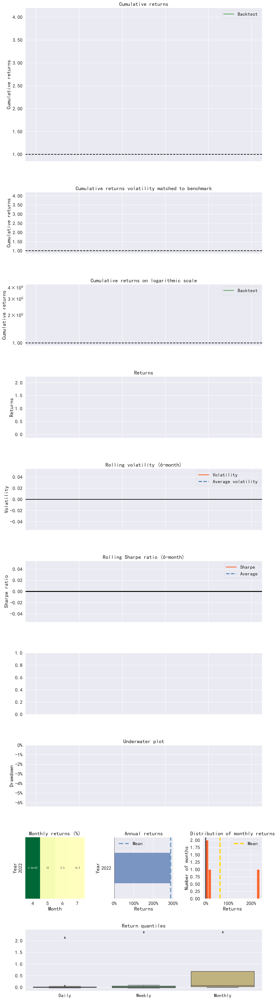

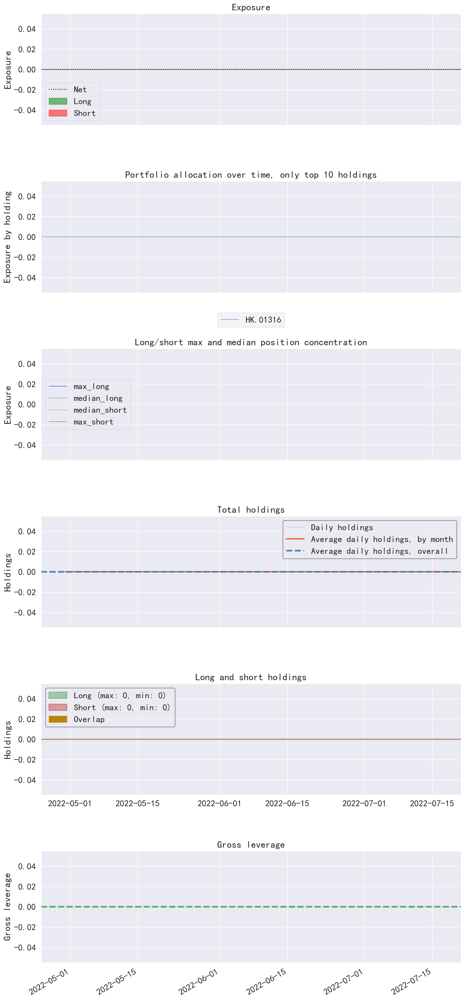

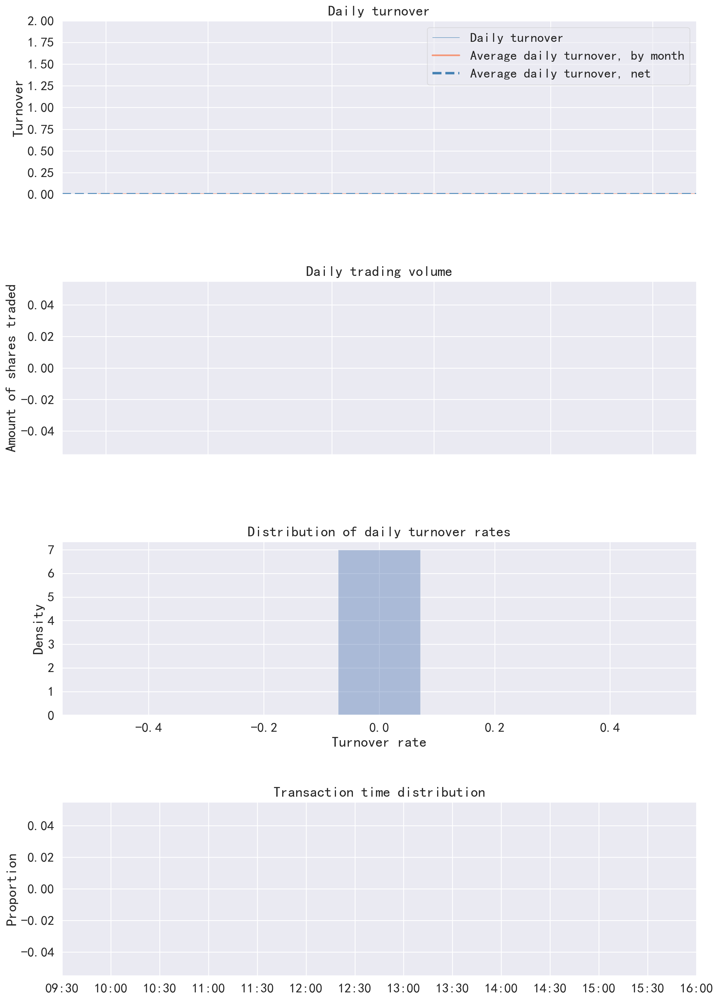

In [46]:
cerebro5 = runstrategy(stop_loss=2.7, fromdate='2022-04-25', enddate=enddate, cash=5505, init_position0=400, init_price0=40.00)

In [47]:
#quote_context.close()
#trade_context.close()